<a href="https://www.kaggle.com/code/abdalrhamnhebishy/bike-rental-prediction-ipynb?scriptVersionId=211614344" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
from IPython.core.display import HTML
# Apply styles globally within the notebook
HTML('''
<style>
  h2 {
    font-size: var(--j3p-content-font-size4);
    background-color:#33ffc1;
    color: white;
    display: flex;
    align-items: center;
    justify-content: center;
    padding: 10px 41px;
    top: 10px;
    position: relative;
    border-radius: 10px 50px 10px 50px;
}

 img {       /* flex-grow: 1; */
            /* flex-shrink: 1; */
            border-radius: 100px 70px 150px 70px; 
            border: 10px solid #eee;
            display: flex;
            align-items: center;
            justify-content: center;
            transition: box-shadow 0.3s ease; /* Add a transition for a smooth effect */
        }

       img:active {
          box-shadow: 0 10px 20px rgba(173, 216, 230, 1) 0 6px 6px rgba(0, 0, 255, 1.0
173, 216, 230, 1);
        }
video {
    width: 820px; /* Set the width of the video */
    height: auto; /* Adjust the height automatically */
    border-radius: 25px; /* Add a border radius for rounded corners */
    border: 5px solid #eee; /* Add a border */
    box-shadow: 0 10px 20px rgba(173, 216, 230, 1), 0 6px 6px rgba((0, 0, 255, 1.0)); /* Add a box shadow */
    display: flex;
    controls: autoplay;
    align-items: center;
    justify-content: center;
    transition: box-shadow 0.3s ease; /* Add a transition for a smooth effect */
  }

  video:active {
    box-shadow: 0 10px 20px rgba(173, 216, 230, 1), 0 6px 6px rgba();
  }


</style>
''')  

## Bike Rental Prediction :

<img src="https://as1.ftcdn.net/v2/jpg/01/17/62/58/1000_F_117625802_os5LYMvHJ20rJWegManCIJGzDn4wkL7O.jpg" alt="My Image">

## Table of Contents 

<div style="border: 2px solid red; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

   
    
    
<p> &bull;        <a target="_blank"> Introudction</a>  </p> 

<p> &bull;      <a target="_blank"> Explanory Data Analysis</a>  </p>

<p>&bull;       <a target="_blank"> Data Processing</a>  </p>

<p>&bull;       <a target="_blank"> Model Bulding</a> </p>   
    
<p>&bull;       <a target="_blank"> Evalution Metrics </a> </p> 

<p>&bull;       <a target="_blank"> Results & see the best models </a> </p>   

</div>

## Data Information

<div style="border: 2px solid red; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">


<p>&bull;The dataset contains count of public bicycles rented per hour in the Seoul Bike Sharing System, with corresponding weather data and holiday information</p> 

<p>&bull;
Dataset Characteristics : Multivariate

Subject Area : Business

Associated Tasks : Regression

Feature :Type  Integer, Real

Instances : 8760 (num of rows)

Features : 13 </p>

<p>&bull;Additional Information :

Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort.</p>

<p>&bull; It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time.</p> 

<p>&bull; Eventually, providing the city with a stable supply of rental bikes becomes a major concern.</p> 

<p>&bull; The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes.</p> 

<p>&bull; The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information. </p> 

<p>&bull; This Data From : Seoul Bike Sharing Demand
Donated on 2/29/2020</p>   

<p>&bull; <a href="https://archive.ics.uci.edu/dataset/560/seoul+bike+sharing+demand" target="_blank">Data Source</a>.</p>


</div>

## Understand the problem :








<div style="border: 2px solid red; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; This problem Consider as Regression problrm   .</p> 

<p> &bull; Target of this problem to predict on  number of bikes rented per hour and date information.  .</p> 


<p> &bull; I will Train 5 models for Machine learning with visualization of them. (linearRegression,Random ForestRegressor,Decision Tree Regressor,gradient boosting regressor .</p> 

<p>&bull; Also i will Make Explanory Analysis for the Data By using both SQL & Pandas  </p>

<p>&bull; Also i will learn the Relations between the Feature to  Make Different Plots that Represent the Data  </p>   
    
</div>

| Data fields      | Description                                                                                                 |
| ------------- | ----------------------------------------------------------------------------------------------------------- |
| ID           | an ID for this instance                                                                                      |
| Date          |  year-month-day                                                                                       |
| Hour                       |  Hour of he day                                                                             |
| Temperature          |  Temperature in Celsius                                                                                           |
| Humidity               | - %                                                                                 |
| Windspeed        |    - m/s                                                                           |
| Visibility              | - 10m                                                                                   |
|Dew point temperature           |  - Celsius                                                                           |
| Solar radiation   |  - MJ/m2                                                                    |
|Rainfall           | - mm                                                                   |
| Seasons             | Winter, Spring, Summer, Autumn                                                                  |                     
| Holiday            |        - Holiday/No holiday                                                            |    
|Functional Day         |    - NoFunc(Non Functional Hours), Fun(Functional hours)                                                            | 
|y (Target)      |   - Rented Bike count , Count of bikes rented at each hour                                                          | 


## imports 

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import graphviz
from sklearn.preprocessing import StandardScaler,OneHotEncoder,LabelEncoder,MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.datasets import make_regression
from sklearn.tree import DecisionTreeRegressor
from sklearn import metrics
from sklearn.metrics import r2_score, mean_squared_error
from sklearn import tree
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
import sqlite3
from plotly.graph_objs import *
import plotly.express as px 
import plotly.graph_objects as go
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
import warnings

# Suppress all warnings
warnings.filterwarnings('ignore')



In [3]:
# load the data:

data=pd.read_csv("rental_data.csv")
data.head(25)

,ID,Date,y,Hour,Temperature(�C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(�C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
1,1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
2,2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.00,0.0,0.0,Winter,No Holiday,Yes
3,3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
4,4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.00,0.0,0.0,Winter,No Holiday,Yes
5,5,01/12/2017,100,5,-6.4,37,1.5,2000,-18.7,0.00,0.0,0.0,Winter,No Holiday,Yes
6,6,01/12/2017,181,6,-6.6,35,1.3,2000,-19.5,0.00,0.0,0.0,Winter,No Holiday,Yes
7,7,01/12/2017,460,7,-7.4,38,0.9,2000,-19.3,0.00,0.0,0.0,Winter,No Holiday,Yes
8,8,01/12/2017,930,8,-7.6,37,1.1,2000,-19.8,0.01,0.0,0.0,Winter,No Holiday,Yes
9,9,01/12/2017,490,9,-6.5,27,0.5,1928,-22.4,0.23,0.0,0.0,Winter,No Holiday,Yes


## Explore the Data :

In [4]:
#get info about the dataset:
print(data.info())
print("-"*25)
# to know more about the shape of the dataset:
print("shape of the dataset -->>",np.shape(data))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5760 entries, 0 to 5759
Data columns (total 15 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   ID                         5760 non-null   int64  
 1   Date                       5760 non-null   object 
 2   y                          5760 non-null   int64  
 3   Hour                       5760 non-null   int64  
 4   Temperature(�C)            5760 non-null   float64
 5   Humidity(%)                5760 non-null   int64  
 6   Wind speed (m/s)           5760 non-null   float64
 7   Visibility (10m)           5760 non-null   int64  
 8   Dew point temperature(�C)  5760 non-null   float64
 9   Solar Radiation (MJ/m2)    5760 non-null   float64
 10  Rainfall(mm)               5760 non-null   float64
 11  Snowfall (cm)              5760 non-null   float64
 12  Seasons                    5760 non-null   object 
 13  Holiday                    5760 non-null   objec

In [5]:
#get the statistical:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,5760.0,2879.500000,1662.913107,0.0,1439.75,2879.50,4319.250,5759.00
y,5760.0,703.483854,655.249491,0.0,188.00,485.50,1066.000,3556.00
Hour,5760.0,11.500000,6.922788,0.0,5.75,11.50,17.250,23.00
Temperature(�C),5760.0,12.803559,11.902206,-15.1,3.20,13.70,22.225,39.40
Humidity(%),5760.0,58.361806,19.840167,0.0,43.00,57.00,73.000,98.00
Wind speed (m/s),5760.0,1.723333,1.047898,0.0,0.90,1.50,2.300,7.40
Visibility (10m),5760.0,1473.711458,585.879880,27.0,1025.75,1732.00,2000.000,2000.00
Dew point temperature(�C),5760.0,4.058264,13.003582,-26.9,-5.40,5.20,14.700,27.20
Solar Radiation (MJ/m2),5760.0,0.572325,0.869943,0.0,0.00,0.01,0.940,3.52
Rainfall(mm),5760.0,0.135122,1.075320,0.0,0.00,0.00,0.000,35.00


In [6]:
# get Types of features:

data.dtypes

ID                             int64
Date                          object
y                              int64
Hour                           int64
Temperature(�C)              float64
Humidity(%)                    int64
Wind speed (m/s)             float64
Visibility (10m)               int64
Dew point temperature(�C)    float64
Solar Radiation (MJ/m2)      float64
Rainfall(mm)                 float64
Snowfall (cm)                float64
Seasons                       object
Holiday                       object
Functioning Day               object
dtype: object

In [7]:
# know the number of every item in every column:

for col in data.columns:
    print(f"counts of items in {col} -->> \n {data[col].value_counts()}")
    print("-"*25)

counts of items in ID -->> 
 ID
0       1
3847    1
3845    1
3844    1
3843    1
       ..
1918    1
1917    1
1916    1
1915    1
5759    1
Name: count, Length: 5760, dtype: int64
-------------------------
counts of items in Date -->> 
 Date
01/12/2017    24
02/12/2017    24
13/07/2018    24
14/07/2018    24
15/07/2018    24
              ..
05/04/2018    24
06/04/2018    24
07/04/2018    24
08/04/2018    24
20/11/2018    24
Name: count, Length: 240, dtype: int64
-------------------------
counts of items in y -->> 
 y
0       247
223      16
165      14
190      13
273      13
       ... 
1709      1
2330      1
2429      1
383       1
788       1
Name: count, Length: 1890, dtype: int64
-------------------------
counts of items in Hour -->> 
 Hour
0     240
1     240
22    240
21    240
20    240
19    240
18    240
17    240
16    240
15    240
14    240
13    240
12    240
11    240
10    240
9     240
8     240
7     240
6     240
5     240
4     240
3     240
2     240
23    240


In [8]:
# to know the uniques values in evey column in the dataset:
for col in data.columns:
    print(f"All items in the ---->>>{col} column  :  \n{data[col].unique()}")
    print("*"*50)

All items in the ---->>>ID column  :  
[   0    1    2 ... 5757 5758 5759]
**************************************************
All items in the ---->>>Date column  :  
['01/12/2017' '02/12/2017' '03/12/2017' '04/12/2017' '05/12/2017'
 '06/12/2017' '07/12/2017' '08/12/2017' '09/12/2017' '10/12/2017'
 '11/12/2017' '12/12/2017' '13/12/2017' '14/12/2017' '15/12/2017'
 '16/12/2017' '17/12/2017' '18/12/2017' '19/12/2017' '20/12/2017'
 '01/01/2018' '02/01/2018' '03/01/2018' '04/01/2018' '05/01/2018'
 '06/01/2018' '07/01/2018' '08/01/2018' '09/01/2018' '10/01/2018'
 '11/01/2018' '12/01/2018' '13/01/2018' '14/01/2018' '15/01/2018'
 '16/01/2018' '17/01/2018' '18/01/2018' '19/01/2018' '20/01/2018'
 '01/02/2018' '02/02/2018' '03/02/2018' '04/02/2018' '05/02/2018'
 '06/02/2018' '07/02/2018' '08/02/2018' '09/02/2018' '10/02/2018'
 '11/02/2018' '12/02/2018' '13/02/2018' '14/02/2018' '15/02/2018'
 '16/02/2018' '17/02/2018' '18/02/2018' '19/02/2018' '20/02/2018'
 '01/03/2018' '02/03/2018' '03/03/2018' '

In [9]:
# Extract all Types of columns from the data :
for col in data.columns:
    obj_cols=data.select_dtypes("object").columns

    num_cols=data.select_dtypes("number").columns

    disc_cols=data.select_dtypes(include=("int64")).columns

    conts_cols=data.select_dtypes(include=("float64")).columns

    Nomial_cols=data.nunique()[data.nunique()<3]

print(f"object_columns ----->>> {obj_cols}\n Numerical_columns ----->>> {num_cols} \n Discrete_columns ---->>> {disc_cols} \n Continous_cols ----->> {conts_cols} \n Nominal Columns --->> {Nomial_cols}")

object_columns ----->>> Index(['Date', 'Seasons', 'Holiday', 'Functioning Day'], dtype='object')
 Numerical_columns ----->>> Index(['ID', 'y', 'Hour', 'Temperature(�C)', 'Humidity(%)', 'Wind speed (m/s)',
       'Visibility (10m)', 'Dew point temperature(�C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)'],
      dtype='object') 
 Discrete_columns ---->>> Index(['ID', 'y', 'Hour', 'Humidity(%)', 'Visibility (10m)'], dtype='object') 
 Continous_cols ----->> Index(['Temperature(�C)', 'Wind speed (m/s)', 'Dew point temperature(�C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)'],
      dtype='object') 
 Nominal Columns --->> Holiday            2
Functioning Day    2
dtype: int64


## Cleaning :







<div style="border: 3px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; At First i checked if ound any Null Values . </p> 

<p> &bull; Also i Removed unless columns like ID . </p>

<p> &bull; I checked Duplicates values & Remove it if ound . </p>

<p> &bull; I removed Structure null values like (units in the columns)  </p>

<p> &bull; I used the Simple Imputer Method to fill the Null Values if it was very big . </p> 

<p> &bull; I used median Strategy with Numerical Features  .</p> 

<p> &bull; I make Reshape , then i make squeeze on it  . </p>

<p> &bull; Any Column , Rate of missing values Reach above 75% ,Delete it  . </p>

</div>








In [10]:
# check the Null Values :
# ok there no Any Null values :
data.isna().mean()

ID                           0.0
Date                         0.0
y                            0.0
Hour                         0.0
Temperature(�C)              0.0
Humidity(%)                  0.0
Wind speed (m/s)             0.0
Visibility (10m)             0.0
Dew point temperature(�C)    0.0
Solar Radiation (MJ/m2)      0.0
Rainfall(mm)                 0.0
Snowfall (cm)                0.0
Seasons                      0.0
Holiday                      0.0
Functioning Day              0.0
dtype: float64

In [11]:
# Drop any null values if found :
df = data.dropna()
df.isna().mean()

ID                           0.0
Date                         0.0
y                            0.0
Hour                         0.0
Temperature(�C)              0.0
Humidity(%)                  0.0
Wind speed (m/s)             0.0
Visibility (10m)             0.0
Dew point temperature(�C)    0.0
Solar Radiation (MJ/m2)      0.0
Rainfall(mm)                 0.0
Snowfall (cm)                0.0
Seasons                      0.0
Holiday                      0.0
Functioning Day              0.0
dtype: float64

In [12]:
# Drop unless column like ID :

df=df.drop("ID",axis=1)
df.columns

Index(['Date', 'y', 'Hour', 'Temperature(�C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(�C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [13]:
# Check if there are aduplicated values in the data & drop it if found :
df=data
duplicated_features=df.duplicated().sum()
print("Number of duplicates ----->>> ",duplicated_features)
df = df.drop_duplicates()
duplicated_features=df.duplicated().sum()
print("Number of duplicates of cleaning it ----->>> ",duplicated_features)

Number of duplicates ----->>>  0
Number of duplicates of cleaning it ----->>>  0


In [14]:
df.columns

Index(['ID', 'Date', 'y', 'Hour', 'Temperature(�C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(�C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [15]:
# Remove units and other elements from column headers
df = data.rename(columns={
    'Temperature(�C)': 'Temperature',
    'Humidity(%)': 'Humidity',
    'Wind speed (m/s)': 'Wind_speed',
    'Visibility (10m)':'Visibility',
    'Dew point temperature(�C)':'Dew_point_temperature',
    'Solar Radiation (MJ/m2)':'Solar_Radiation',
    'Rainfall(mm)':'Rainfall',
    'Snowfall (cm)':'Snowfall(cm)'
    })

df.head(10)


,ID,Date,y,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall(cm),Seasons,Holiday,Functioning Day
0,0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
1,1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
2,2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.00,0.0,0.0,Winter,No Holiday,Yes
3,3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
4,4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.00,0.0,0.0,Winter,No Holiday,Yes
5,5,01/12/2017,100,5,-6.4,37,1.5,2000,-18.7,0.00,0.0,0.0,Winter,No Holiday,Yes
6,6,01/12/2017,181,6,-6.6,35,1.3,2000,-19.5,0.00,0.0,0.0,Winter,No Holiday,Yes
7,7,01/12/2017,460,7,-7.4,38,0.9,2000,-19.3,0.00,0.0,0.0,Winter,No Holiday,Yes
8,8,01/12/2017,930,8,-7.6,37,1.1,2000,-19.8,0.01,0.0,0.0,Winter,No Holiday,Yes
9,9,01/12/2017,490,9,-6.5,27,0.5,1928,-22.4,0.23,0.0,0.0,Winter,No Holiday,Yes


## Feature Engeneering :







<div style="border: 3px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; first : i get the Minimum & Maximum for each feature  </p> 

<p> &bull; Then i Divide every feature into Categories base on Range of values  . </p>

<p> &bull; at least , we can say that we doing feature Engeneering with correctly style  . </p>

<p> &bull;ex : Date Divide into Day , Month , Year </p>

<p> &bull; other Features into Categories (very low , low , monderate , week mondarate , High,.....). </p> 


</div>








In [16]:
# to know the min & max value at each feaure :

for col in df.columns :
    print(f"maximum value at {col} = {np.max(df[col])} & minimum value = {np.min(df[col])} ")
    print("-"*50)

maximum value at ID = 5759 & minimum value = 0 
--------------------------------------------------
maximum value at Date = 20/12/2017 & minimum value = 01/01/2018 
--------------------------------------------------
maximum value at y = 3556 & minimum value = 0 
--------------------------------------------------
maximum value at Hour = 23 & minimum value = 0 
--------------------------------------------------
maximum value at Temperature = 39.4 & minimum value = -15.1 
--------------------------------------------------
maximum value at Humidity = 98 & minimum value = 0 
--------------------------------------------------
maximum value at Wind_speed = 7.4 & minimum value = 0.0 
--------------------------------------------------
maximum value at Visibility = 2000 & minimum value = 27 
--------------------------------------------------
maximum value at Dew_point_temperature = 27.2 & minimum value = -26.9 
--------------------------------------------------
maximum value at Solar_Radiation = 

In [17]:
# make feature engeneering for visibility_value :

def get_visibility_condition(visibility_value):
    if visibility_value < 50:return 1   # Poor
        
    elif 50 <= visibility_value < 500:return 2   # Moderate
        
    elif 500 <= visibility_value < 1000:return 3 # Good
        
    elif visibility_value >= 1000:return 4     # Excellent
    else:return 0   # unknown 
df['Visibility'] = df['Visibility'].apply(get_visibility_condition)


In [18]:
#Divide Date into Day , month and year : 

df['Date'] = pd.to_datetime(df['Date'], format="%d/%m/%Y")

# New Columns 
df['Day'] = df['Date'].dt.day
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year


In [19]:
# Divide Temprature based on ranges of values into categories :

def get_temperature_condation(temperature):
    if temperature < -15.1: return 1            # Extremely Cold
    elif -15.1 <= temperature < 0: return 2    # Very Cold
    elif 0 <= temperature < 10: return 3        # Cold
    elif 10 <= temperature < 20:return  4       # Cool
    elif 20 <= temperature < 30:return 5      # Moderate
    elif 30 <= temperature < 40:return  6       # Warm
    elif 40 <= temperature <= 50:return  7      # Hot
    else:return  8                            #  Extreme
df["Temperature"]=df["Temperature"].apply(get_temperature_condation)


In [20]:
# Divide himidity based on ranges of values into categories :

def get_humidity_condation(humidity):
    if humidity < 20: return  1           # Very Dry
    elif 20 <= humidity < 40: return 2      # Dry
    elif 40 <= humidity < 60:  return 3   # Moderate
    elif 60 <= humidity < 80: return 4       # Humid
    elif 80 <= humidity <= 98: return 5      # Very Humid
    else: return 6        # Extreme

df["Humidity"]=df["Humidity"].apply(get_humidity_condation) 


In [21]:
# Divide Wind_speed based on ranges of values into categories  :

def get_Wind_speed_condition(Wind_speed):
    if Wind_speed < 1: return  1               # Very Low
    elif 1 <= Wind_speed < 2: return 2      # Low
    elif 2 <= Wind_speed < 3: return 3       # Moderate Low
    elif 3 <= Wind_speed < 4: return 4     # Moderate
    elif 4 <= Wind_speed < 5: return  5         # Moderate High
    elif 5 <= Wind_speed < 6: return  6       #High
    elif 6 <= Wind_speed <= 7.4: return 7      #Very High
    else: return 8      # Extreme

df["Wind_speed"]=df["Wind_speed"].apply(get_Wind_speed_condition) 


In [22]:
#Divide Solar Radition into categories based on Range of values : 

def get_solar_radiation(solar_radiation):
    if solar_radiation < 0.5: return 1     # Very Week
    elif 0.5 <= solar_radiation < 1.0:return  2   # Week
    elif 1.0 <= solar_radiation < 2.0:return 3    # Moderate Week
    elif 2.0 <= solar_radiation < 3.0:return  4    # Moderate
    elif 3.0 <= solar_radiation <= 3.52:return 5    # Strong
    else:return  6  # Extreme

df['Solar_Radiation'] = df['Solar_Radiation'].apply(get_solar_radiation)



In [23]:

# Divide rainfall into categories based on the range of it values : 

def get_rainfall(rainfall):
    if rainfall < 5:return 1                 # Very Week
    elif 5 <= rainfall < 10:return 2          # Week
    elif 10 <= rainfall < 15:return 3        # Moderate Week
    elif 15 <= rainfall < 20:return 4         # Moderate
    elif 20 <= rainfall < 25:return  5         # Moderate High
    elif 25 <= rainfall < 30:return 6           # High
    elif 30 <= rainfall <= 35:return 7        # Very High
    else:return  8  #Extreme


df['Rainfall'] = df['Rainfall'].apply(get_rainfall)
print(df)


        ID       Date     y  Hour  Temperature  Humidity  Wind_speed  \
0        0 2017-12-01   254     0            2         2           3   
1        1 2017-12-01   204     1            2         2           1   
2        2 2017-12-01   173     2            2         2           2   
3        3 2017-12-01   107     3            2         3           1   
4        4 2017-12-01    78     4            2         2           3   
...    ...        ...   ...   ...          ...       ...         ...   
5755  5755 2018-11-20  1317    19            3         2           3   
5756  5756 2018-11-20  1078    20            3         2           3   
5757  5757 2018-11-20  1020    21            3         2           4   
5758  5758 2018-11-20   922    22            3         3           4   
5759  5759 2018-11-20   378    23            3         3           4   

      Visibility  Dew_point_temperature  Solar_Radiation  Rainfall  \
0              4                  -17.6                1         

## Explanory on Dataset: 




<div style="border: 5px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; Contex : </p> 

<p> &bull; Correlation : I make correlation to study Relations between features </p> 

<p> &bull; outliers : Defination outliers and check on each feature   .</p> 
<p> &bull; outliers : see percentage of every outliers at any column and how dealing with it    .</p> 

<p> &bull; heatmap : very strong plot that show the Strong / week Relations between features   .</p> 
</div>

In [24]:
# Calculate the correlation :

corr=df.select_dtypes("number").corr()
corr

,ID,y,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall(cm),Day,Month,Year
ID,1.000000,0.365359,4.163048e-03,0.623243,0.194885,-0.163724,0.066831,0.628503,0.105484,0.030107,-0.207435,8.322910e-02,5.365886e-01,4.787136e-01
y,0.365359,1.000000,4.071798e-01,0.525055,-0.176948,0.112916,0.203714,0.392454,0.243850,-0.069777,-0.120836,4.589734e-02,1.671808e-01,2.018374e-01
Hour,0.004163,0.407180,1.000000e+00,0.124553,-0.268617,0.283169,0.079712,-0.000374,0.140350,-0.003122,-0.013013,-5.501088e-18,1.068812e-15,4.561664e-15
Temperature,0.623243,0.525055,1.245530e-01,1.000000,0.174986,-0.038094,0.046154,0.892573,0.315817,0.038321,-0.187411,1.800532e-03,2.464735e-01,3.937205e-01
Humidity,0.194885,-0.176948,-2.686169e-01,0.174986,1.000000,-0.332441,-0.473166,0.528168,-0.462647,0.109220,0.079158,-6.401131e-02,1.293612e-01,7.564001e-02
Wind_speed,-0.163724,0.112916,2.831692e-01,-0.038094,-0.332441,1.000000,0.154356,-0.175764,0.325178,0.001233,-0.017503,-7.134812e-02,-1.428706e-01,-1.732903e-02
Visibility,0.066831,0.203714,7.971221e-02,0.046154,-0.473166,0.154356,1.000000,-0.138388,0.183563,-0.098457,-0.107730,-5.883612e-02,5.315382e-02,1.924666e-02
Dew_point_temperature,0.628503,0.392454,-3.742059e-04,0.892573,0.528168,-0.175764,-0.138388,1.000000,0.074996,0.076163,-0.131155,-1.844692e-02,2.774693e-01,3.692559e-01
Solar_Radiation,0.105484,0.243850,1.403502e-01,0.315817,-0.462647,0.325178,0.183563,0.074996,1.000000,-0.044596,-0.065546,8.961950e-03,-3.266175e-03,1.121849e-01
Rainfall,0.030107,-0.069777,-3.121980e-03,0.038321,0.109220,0.001233,-0.098457,0.076163,-0.044596,1.000000,-0.010103,-1.654521e-02,1.114641e-02,2.129600e-02


Text(0.5, 1.0, 'Correlation_heatmap_Matrix')

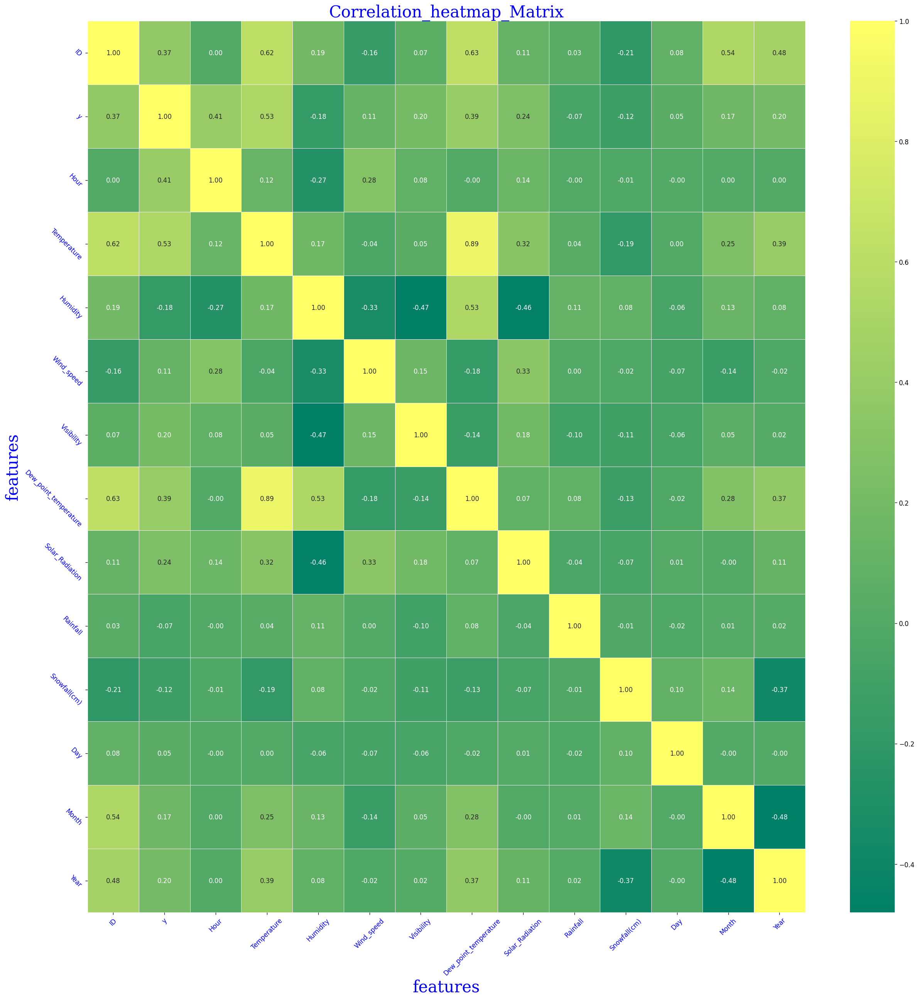

In [25]:
# plot the heatmap:
# plot the heatmap_Correlation_MatRix:

f1={"family":"serif","size":25,"color":"b"}
plt.figure(figsize=(25,25),dpi=120)
sns.heatmap(df.select_dtypes("number").corr(),annot=True,fmt="0.2f",cmap='summer',linewidths=0.5)
plt.xticks(rotation=45,color="b")
plt.yticks(rotation=-45,color="b")
plt.xlabel("features",fontdict=f1)
plt.ylabel("features",fontdict=f1)
plt.title("Correlation_heatmap_Matrix",fontdict=f1)

## Defination Outliers :

In [26]:
# found many feature contain the outliers  :
features=df.select_dtypes(include="number").columns

for col in features:
    Q1_col,Q3_col=df[col].quantile([0.25,0.75])
    iqr=Q3_col-Q1_col
    low_limit=Q1_col-1.5*iqr
    upper_limit=Q3_col+1.5*iqr
    outlier=[]
    for x in df[col]:
         if ((x> upper_limit) or (x<low_limit)):
             outlier.append(x)
    if len(outlier)==0:
        print(f" * -- >> there No outlier in {col} feature")
    else:
        print(f"Ther outlier in this feature {col}")

    print(f"Q1 of {col} --->>> {Q1_col} \n Q3 of {col} ---->>> {Q3_col} \n iqr--->>{iqr}\n low_limit--->>>{low_limit} \n  upper_limit--->>> {upper_limit} \n outlier---->>> {outlier} \n Number of outliers --->>> {len(outlier)} ")
    print("-"*25)
    

 * -- >> there No outlier in ID feature
Q1 of ID --->>> 1439.75 
 Q3 of ID ---->>> 4319.25 
 iqr--->>2879.5
 low_limit--->>>-2879.5 
  upper_limit--->>> 8638.5 
 outlier---->>> [] 
 Number of outliers --->>> 0 
-------------------------
Ther outlier in this feature y
Q1 of y --->>> 188.0 
 Q3 of y ---->>> 1066.0 
 iqr--->>878.0
 low_limit--->>>-1129.0 
  upper_limit--->>> 2383.0 
 outlier---->>> [2401, 2402, 2401, 2404, 2692, 2661, 2392, 3130, 2405, 2701, 2410, 2906, 2915, 2479, 2439, 2403, 3088, 2505, 2514, 2460, 3380, 2788, 2508, 3227, 2615, 2404, 3221, 2649, 3309, 2797, 2476, 2431, 2495, 3404, 2873, 2579, 2505, 2474, 2664, 2479, 2404, 2962, 2460, 2891, 2984, 2441, 2451, 2475, 2497, 2435, 2474, 2481, 2429, 2515, 2430, 3556, 2809, 2525, 2440, 3384, 2741, 2519, 2965, 2598, 2398, 3080, 2637, 2415, 2594, 3196, 2557, 2931, 3016, 2884, 2636, 2770, 2692, 2640, 2419, 2481, 2797, 2628, 3166, 2491, 3160, 2468, 2497, 3154, 3298, 2518, 3222, 2455, 2391, 3256, 2443, 3146, 2826, 3277, 2489, 2857, 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


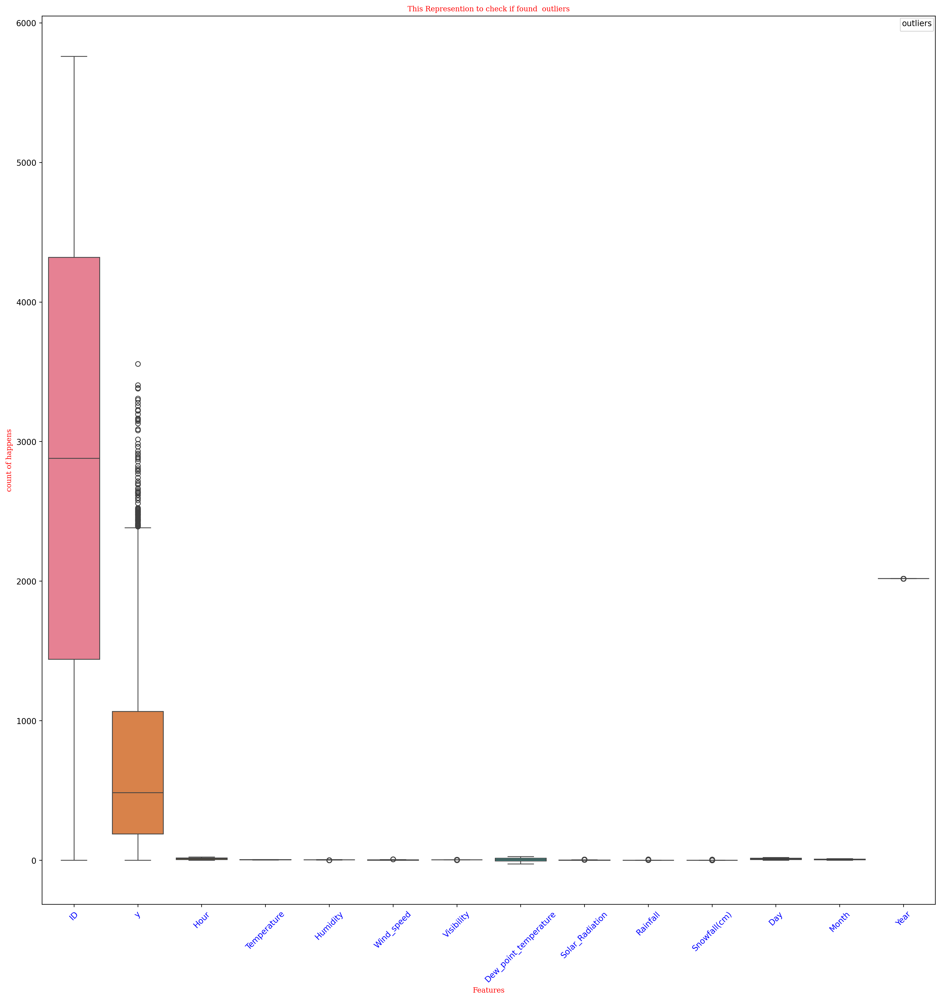

In [27]:
# from this Represention we discover that we found outliers :

f1={"family":"serif","size":9,"color":"r"}
plt.figure(figsize=(20,20),dpi=250)
plt.title("This Represention to check if found  outliers",fontdict=f1)
plt.xlabel("Features",fontdict=f1)
plt.ylabel("count of happens",fontdict=f1)
plt.xticks(rotation=45,color="b")
sns.boxplot(df[features])
plt.legend(title="outliers",prop={'size': 5})

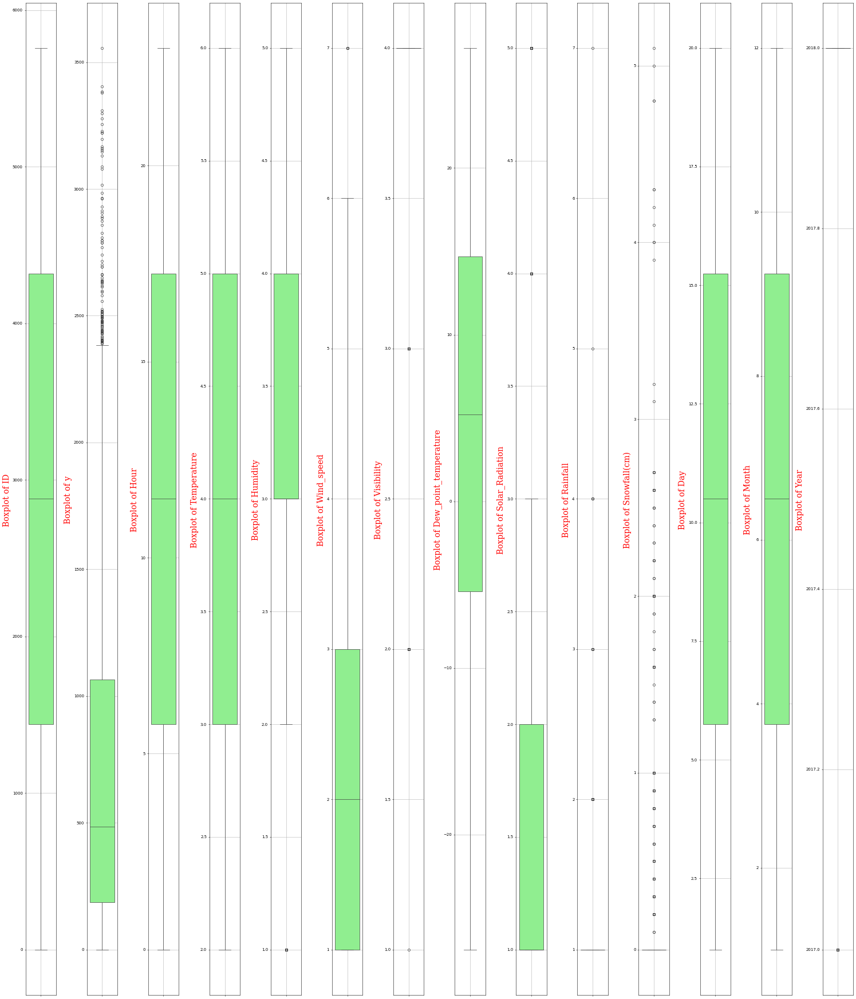

In [28]:
# Some Another Definations :

F=df.select_dtypes(include="number").columns 
num_columns = len(F)
plt.figure(figsize=(30,35),dpi=50)
f2={"family":"serif","size":20,"color":"r"}

# Create side-by-side boxplots for each feature :

for i, feature in enumerate(F):
    plt.subplot(1, num_columns, i + 1)
    sns.boxplot(df[feature].dropna(), patch_artist=True, boxprops=dict(facecolor='lightgreen'))
    plt.ylabel(f'Boxplot of {feature} ',fontdict=f2)
    plt.xticks(rotation=45, color="b")
    plt.grid(True)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

In [29]:
# split the data int train & test :

x_reg,y_reg=make_regression()
x_reg=df.drop("y",axis=1)
y_reg=df["y"]

In [30]:
def remove_outliers_iqr(df):
    outlier_counts = {}
    outlier_means = {}
    
    
    for column in df.select_dtypes(include=[np.number]).columns:  
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Identify outliers
        
        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        
        outlier_counts[column] = outliers.shape[0]
        
        # Calculate mean of outliers if any exist
        
        if not outliers.empty:
            outlier_means[column] = outliers[column].mean()
        else:
            outlier_means[column] = 0.0
        
        # Remove outliers from the DataFrame
        
        df_cleaned_without_target = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    
    return df_cleaned_without_target, outlier_counts, outlier_means


df_cleaned_without_target, outlier_counts, outlier_means = remove_outliers_iqr(x_reg)


# Display the results
print("Number of outliers detected in each column:")
print(outlier_counts)
print("-" * 70)
print("\nMean of outliers in each column:")
print(outlier_means)
print("-" * 70)
print("\nDataFrame after removing outliers:")
print(df_cleaned_without_target)

Number of outliers detected in each column:
{'ID': 0, 'Hour': 0, 'Temperature': 0, 'Humidity': 63, 'Wind_speed': 6, 'Visibility': 1397, 'Dew_point_temperature': 0, 'Solar_Radiation': 620, 'Rainfall': 40, 'Snowfall(cm)': 180, 'Day': 0, 'Month': 0, 'Year': 480}
----------------------------------------------------------------------

Mean of outliers in each column:
{'ID': 0.0, 'Hour': 0.0, 'Temperature': 0.0, 'Humidity': 1.0, 'Wind_speed': 7.0, 'Visibility': 2.567644953471725, 'Dew_point_temperature': 0.0, 'Solar_Radiation': 4.164516129032258, 'Rainfall': 2.675, 'Snowfall(cm)': 1.481666666666667, 'Day': 0.0, 'Month': 0.0, 'Year': 2017.0}
----------------------------------------------------------------------

DataFrame after removing outliers:
        ID       Date  Hour  Temperature  Humidity  Wind_speed  Visibility  \
480    480 2018-01-01     0            2         3           1           4   
481    481 2018-01-01     1            2         3           1           4   
482    482 2018-

## check the outliers after cleaning the data :

## Checking outliers after cleaning the Data without Target : 




<div style="border: 5px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; After Cleaning Data Without Target : </p> 

<p> &bull; we found that : number outliers in columans that was inside it outliers is Reduced </p> 

<p> &bull; outliers : For that we will fill this outliers to make the Data Cleaning  .</p> 

</div>

In [31]:
# found many feature contain the outliers  :

f=df_cleaned_without_target.select_dtypes(include="number").columns

for col in f:
    Q1_col,Q3_col=df_cleaned_without_target[col].quantile([0.25,0.75])
    iqr=Q3_col-Q1_col
    low_limit=Q1_col-1.5*iqr
    upper_limit=Q3_col+1.5*iqr
    outlier=[]
    for x in df_cleaned_without_target[col]:
         if ((x> upper_limit) or (x<low_limit)):
             outlier.append(x)
    if len(outlier)==0:
        print(f" * -- >> there No outlier in {col} feature")
    else:
        print(f"Ther outlier in this feature {col}")

    print(f"Q1 of {col} --->>> {Q1_col} \n Q3 of {col} ---->>> {Q3_col} \n iqr--->>{iqr}\n low_limit--->>>{low_limit} \n  upper_limit--->>> {upper_limit} \n outlier---->>> {outlier} \n Number of outliers --->>> {len(outlier)} ")
    print("-"*70)
    

 * -- >> there No outlier in ID feature
Q1 of ID --->>> 1799.75 
 Q3 of ID ---->>> 4439.25 
 iqr--->>2639.5
 low_limit--->>>-2159.5 
  upper_limit--->>> 8398.5 
 outlier---->>> [] 
 Number of outliers --->>> 0 
----------------------------------------------------------------------
 * -- >> there No outlier in Hour feature
Q1 of Hour --->>> 5.75 
 Q3 of Hour ---->>> 17.25 
 iqr--->>11.5
 low_limit--->>>-11.5 
  upper_limit--->>> 34.5 
 outlier---->>> [] 
 Number of outliers --->>> 0 
----------------------------------------------------------------------
 * -- >> there No outlier in Temperature feature
Q1 of Temperature --->>> 3.0 
 Q3 of Temperature ---->>> 5.0 
 iqr--->>2.0
 low_limit--->>>0.0 
  upper_limit--->>> 8.0 
 outlier---->>> [] 
 Number of outliers --->>> 0 
----------------------------------------------------------------------
Ther outlier in this feature Humidity
Q1 of Humidity --->>> 3.0 
 Q3 of Humidity ---->>> 4.0 
 iqr--->>1.0
 low_limit--->>>1.5 
  upper_limit--->>> 5.

## fillna the outliers :

In [32]:
def replace_outliers(df):
    quantiles = df.quantile([0.25, 0.75])
    
    # Calculate lower and upper bounds
    lower_bound = quantiles[0.25] - (quantiles[0.75] - quantiles[0.25]) * 1.5
    upper_bound = quantiles[0.75] + (quantiles[0.75] - quantiles[0.25]) * 1.5
    
    # replace outliers with minimum or maximum values
    df = df.apply(lambda x: np.where((x < lower_bound), np.min(x), 
                                      np.where(x > upper_bound, np.max(x), x)))
    
    return df

# Fillna outliers in this features:

df_cleaned_without_target["Rainfall"]=replace_outliers(df_cleaned_without_target["Rainfall"])
df_cleaned_without_target["Visibility"]=replace_outliers(df_cleaned_without_target["Visibility"])
df_cleaned_without_target["Wind_speed"]=replace_outliers(df_cleaned_without_target["Wind_speed"])
df_cleaned_without_target["Humidity"]=replace_outliers(df_cleaned_without_target["Humidity"]) 
print("Data after cleand Data & fillna outliers :",np.shape(df_cleaned_without_target))
print("Data after only Remove outliers :",np.shape(df))

Data after cleand Data & fillna outliers : (5280, 17)
Data after only Remove outliers : (5760, 18)


## Visualization :

Rates Humidity at each season :
 Seasons
Summer    3.700694
Autumn    3.552083
Spring    3.515972
Winter    2.964583
Name: Humidity, dtype: float64


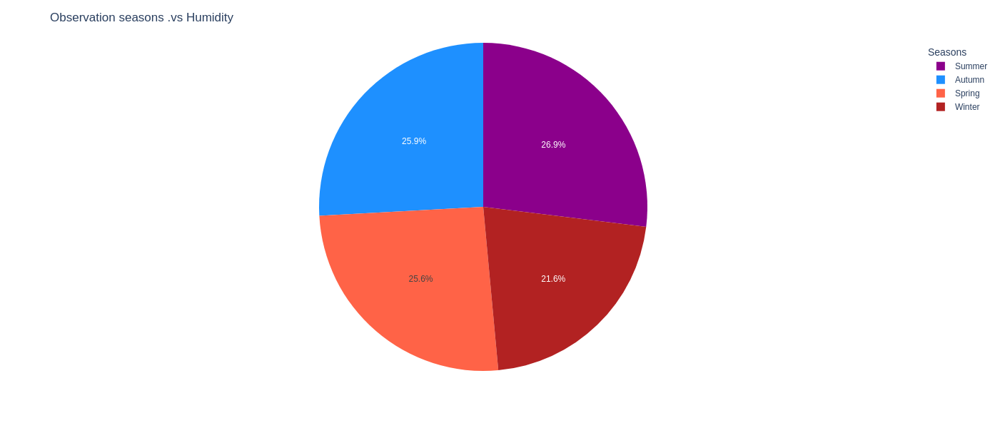

----------------------------------------------------------------------
Rates Temperature at each season :
 Seasons
Summer    5.126389
Autumn    4.076389
Spring    3.702083
Winter    2.327778
Name: Temperature, dtype: float64


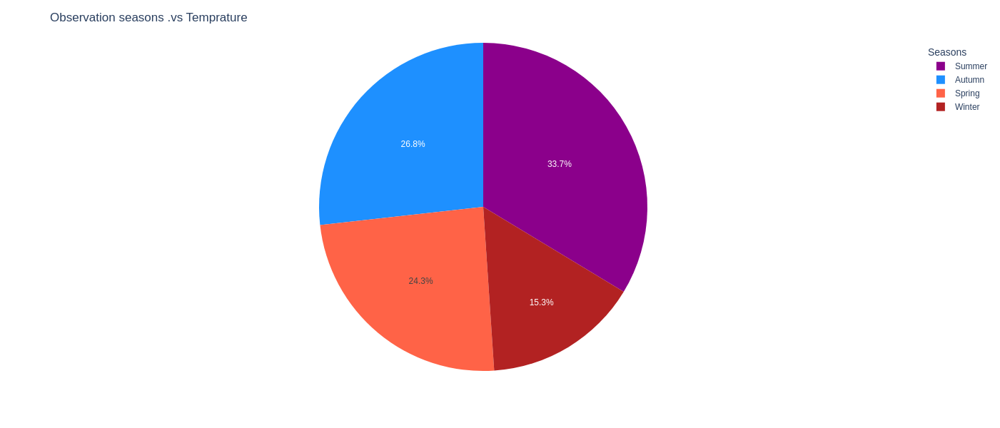

In [33]:
color_palette = ['#8B008B', '#1E90FF', '#FF6347', '#B22222', '#228B22', '#2F4F4F']
# Rates of Humidity aat each season :   :

season = df.groupby("Seasons")["Humidity"].mean().sort_values(ascending=False)

# Display the rates of humidity at every season :

print("Rates Humidity at each season :\n",season)

season_index = season.reset_index()
fig = px.pie(season_index, names='Seasons', values='Humidity', color_discrete_sequence=color_palette)

fig.update_layout(
    title="Observation seasons .vs Humidity",
    legend_title="Seasons",
    width=800,  
    height=600  
         )
# Show the plot
fig.show()
#################################################
print("-"*70)

# Rates of Temperature at each season :   :

season1 = df.groupby("Seasons")["Temperature"].mean().sort_values(ascending=False)

# Display the rates of humidity at every season :

print("Rates Temperature at each season :\n",season1)

season_index = season1.reset_index()
fig = px.pie(season_index, names='Seasons', values='Temperature', color_discrete_sequence=color_palette)

fig.update_layout(
    title="Observation seasons .vs Temprature",
    legend_title="Seasons",
    width=800,  
    height=600  
         )
# Show the plot
fig.show()



In [34]:
df.columns

Index(['ID', 'Date', 'y', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall(cm)', 'Seasons', 'Holiday', 'Functioning Day', 'Day', 'Month',
       'Year'],
      dtype='object')

Rates Snowfall at each season :
 Seasons
Summer    1.017361
Spring    1.015278
Autumn    1.013889
Winter    1.000000
Name: Rainfall, dtype: float64


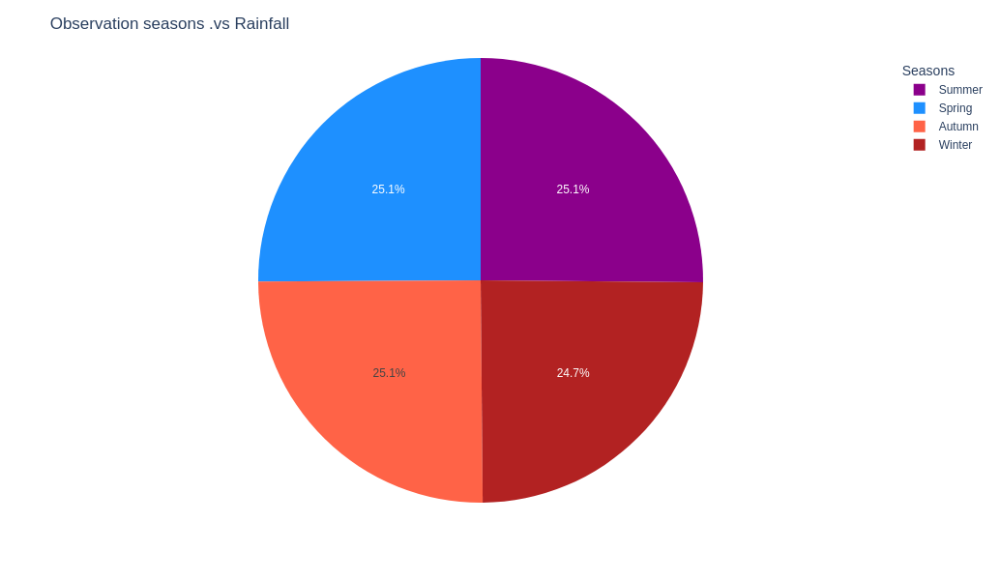

----------------------------------------------------------------------
Rates of Visibility at each season:
 Seasons
Summer    3.793750
Autumn    3.704167
Winter    3.659722
Spring    3.452778
Name: Visibility, dtype: float64


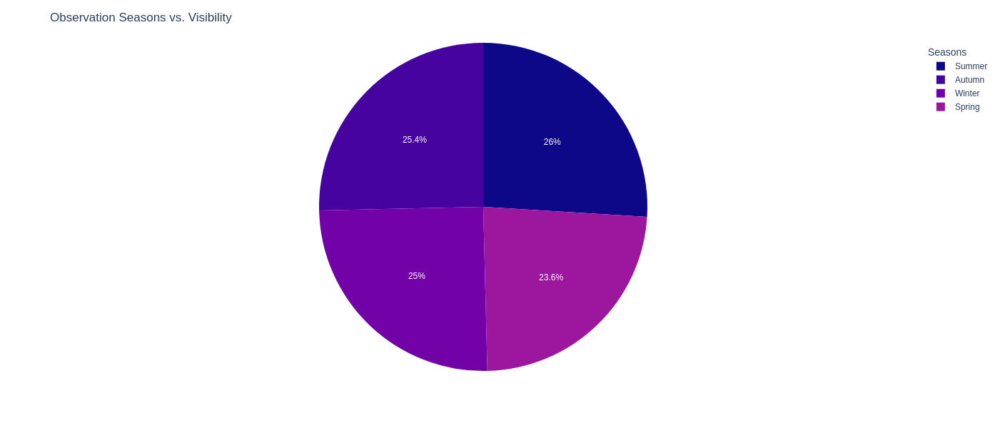

In [35]:
# Rates of Rainfall at each season :   :

season2 = df.groupby("Seasons")["Rainfall"].mean().sort_values(ascending=False)

# Display the rates of Rainfall at every season :

print("Rates Snowfall at each season :\n",season2)

season_index = season2.reset_index()
fig = px.pie(season_index, names='Seasons', values='Rainfall', color_discrete_sequence=color_palette)

fig.update_layout(
    title="Observation seasons .vs Rainfall",
    legend_title="Seasons",
    width=800,  
    height=600  
         )
# Show the plot
fig.show()
print("-"*70)
#####################################################

# Calculate mean visibility for each season
season3 = df.groupby("Seasons")["Visibility"].mean().sort_values(ascending=False)


print("Rates of Visibility at each season:\n", season3)


season_index = season3.reset_index()

# Create a pie chart
fig = px.pie(season_index, names='Seasons', values='Visibility', color_discrete_sequence=px.colors.sequential.Plasma)

# Update layout for the pie chart
fig.update_layout(
    title="Observation Seasons vs. Visibility",
    legend_title="Seasons",
    width=800,  
    height=600  
)

# Show the plot
fig.show()


In [36]:
df.columns

Index(['ID', 'Date', 'y', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall(cm)', 'Seasons', 'Holiday', 'Functioning Day', 'Day', 'Month',
       'Year'],
      dtype='object')

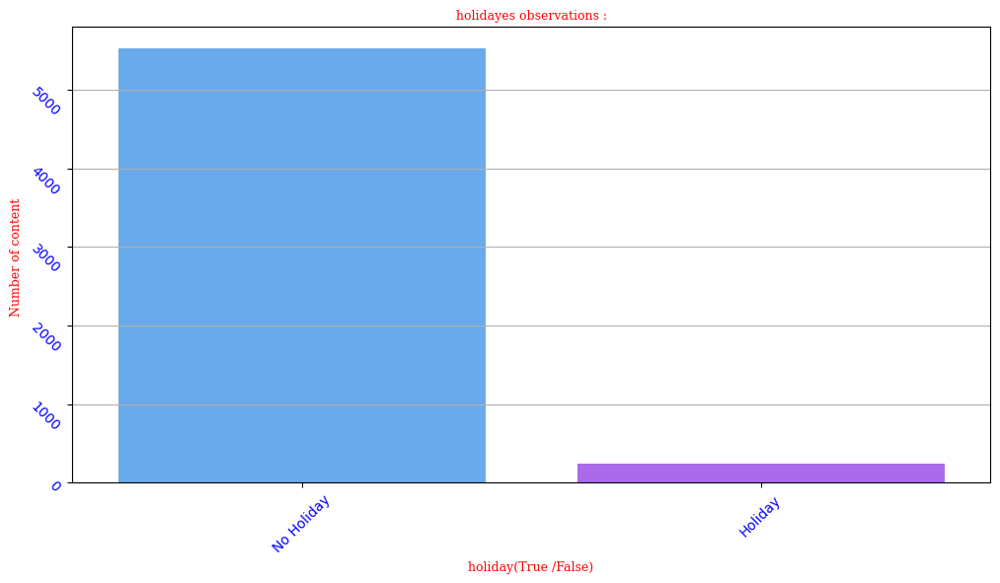

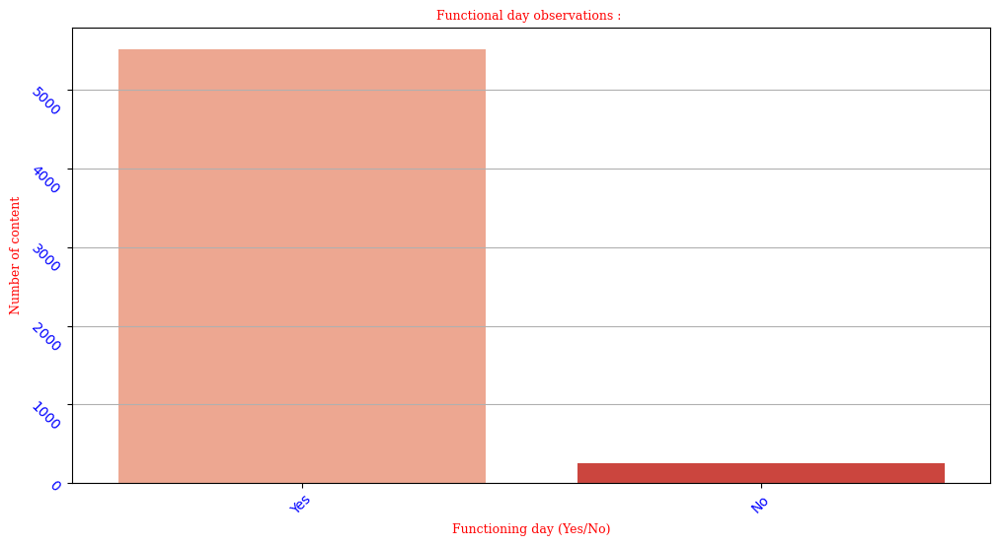

In [37]:
# plot the Holiday observation :

holiday = df['Holiday'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(x=holiday.index, y=holiday.values,hue=holiday.index,palette="cool")
plt.title('holidayes observations :',fontdict=f1)
plt.xlabel('holiday(True /False)',fontdict=f1)
plt.ylabel('Number of content ',fontdict=f1)
plt.grid(True, axis='y')
plt.xticks(rotation=45,color="b")
plt.yticks(rotation=-45,color="b")
plt.show()

# make a bar plot for Functioning Day :

func_day = df['Functioning Day'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(x=func_day.index, y=func_day.values,hue=func_day.index,palette="Reds")
plt.title('Functional day observations : ',fontdict=f1)
plt.xlabel('Functioning day (Yes/No)',fontdict=f1)
plt.ylabel('Number of content',fontdict=f1)
plt.grid(True, axis='y')
plt.xticks(rotation=45,color="b")
plt.yticks(rotation=-45,color="b")
plt.show()

In [38]:
df.columns

Index(['ID', 'Date', 'y', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall(cm)', 'Seasons', 'Holiday', 'Functioning Day', 'Day', 'Month',
       'Year'],
      dtype='object')

Positive Relationship :


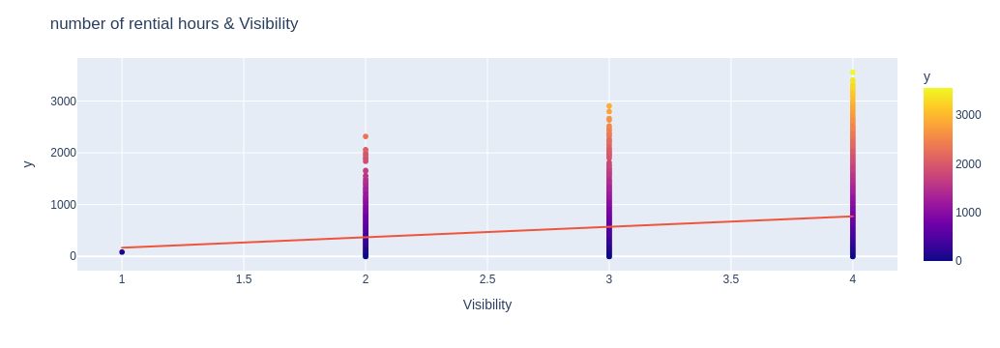

Positive Relationship :


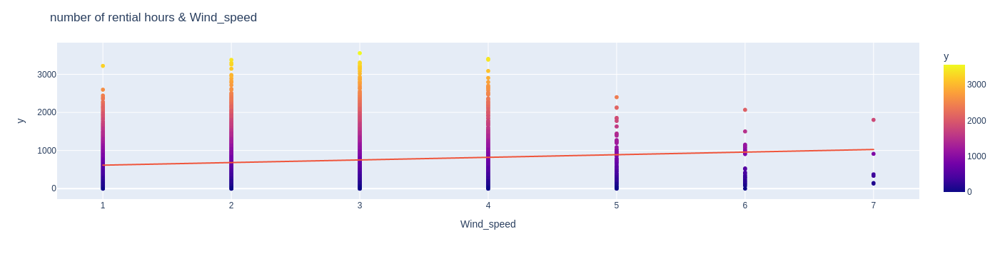

Negative Relationship :


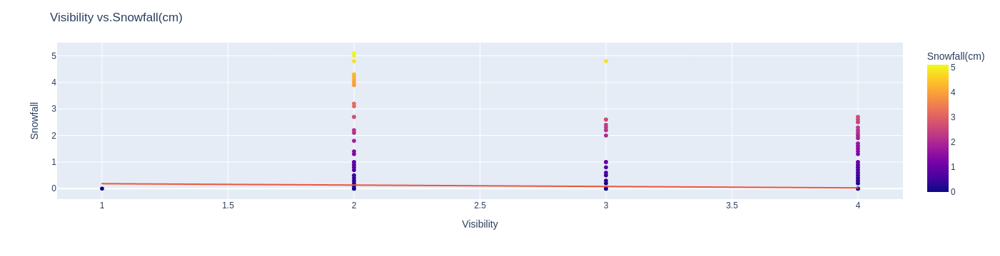

In [39]:
# Observation  between number of rential hours & Visibility  :
print("Positive Relationship :")
fig = px.scatter(df, x='Visibility', y='y', color='y', color_discrete_sequence=color_palette,trendline='ols')
fig.update_layout(title="number of rential hours & Visibility ", xaxis_title="Visibility", yaxis_title="y")
fig.show()

###################################################################################################

# Observation  Wind_speed vs.y (scatterplot)  :
print("Positive Relationship :")
fig = px.scatter(df, x='Wind_speed', y='y', color='y', color_discrete_sequence=color_palette,trendline='ols')
fig.update_layout(title="number of rential hours & Wind_speed ", xaxis_title="Wind_speed", yaxis_title="y")
fig.show()


#######################################################################################################

# Observation  Visibility vs.Snowfall(cm) (scatterplot)  :

print("Negative Relationship :")
fig = px.scatter(df, x='Visibility', y='Snowfall(cm)', color='Snowfall(cm)', color_discrete_sequence=color_palette,trendline='ols')
fig.update_layout(title="Visibility vs.Snowfall(cm)", xaxis_title="Visibility", yaxis_title="Snowfall")
fig.show()


## Waffle Visualization :














<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; i Make Waffle observation to see which feature that Controlled on other Features . </p> 

<p> &bull; i found ID Feature controled on other features .</p> 

<p> &bull; Finally , PRICE Feature : is the most important Feature in the Data   .</p> 


</div>

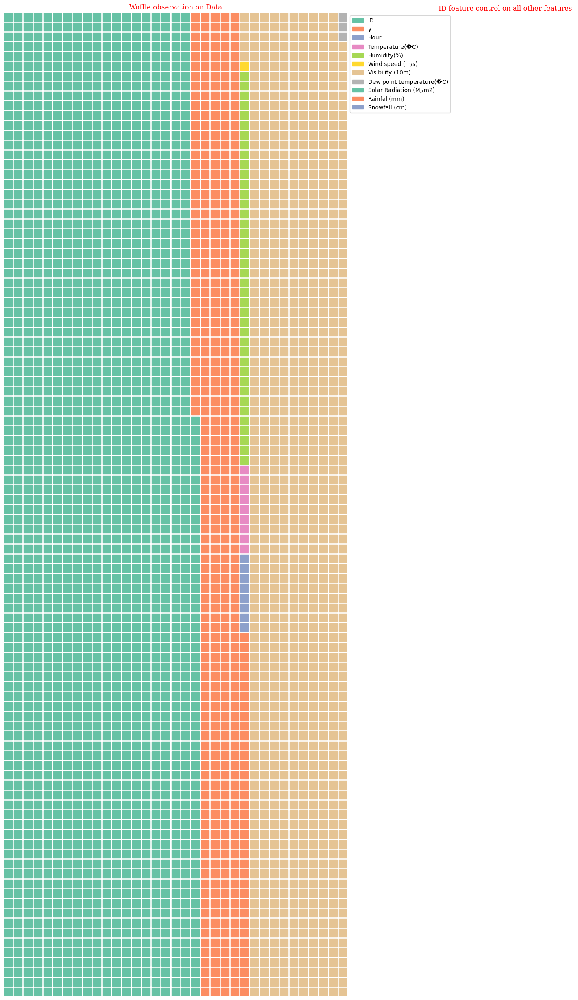

In [40]:
# Make a waffel for the Data:
# from this waffle i see which Feature is a controled on other features : 


f2 = {"family": "serif", "size": 12, "color": "r"}

from pywaffle import Waffle

numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns
values = data[numeric_columns].sum().tolist()

fig = plt.figure(
    FigureClass=Waffle,
    rows=100,
    columns=35,
    values=values,
    legend={'labels': numeric_columns.tolist(),
            'loc': "upper left",
            'bbox_to_anchor': (1, 1)},
    figsize=(25, 25)
)
plt.title("Waffle observation on Data",fontdict=f2)
plt.suptitle("ID feature control on all other features ",fontdict=f2)
plt.show()

In [41]:
df.columns

Index(['ID', 'Date', 'y', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall(cm)', 'Seasons', 'Holiday', 'Functioning Day', 'Day', 'Month',
       'Year'],
      dtype='object')

## By clicking Double click on any Button , you will get the info about this condation

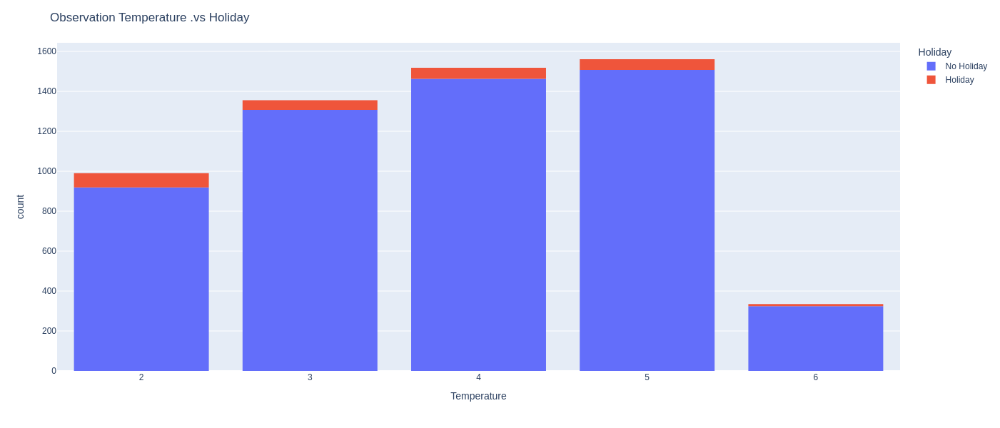

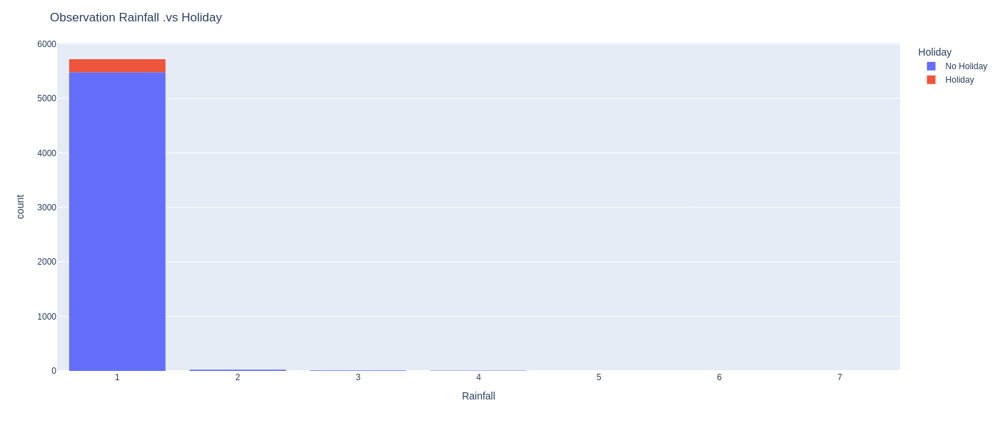

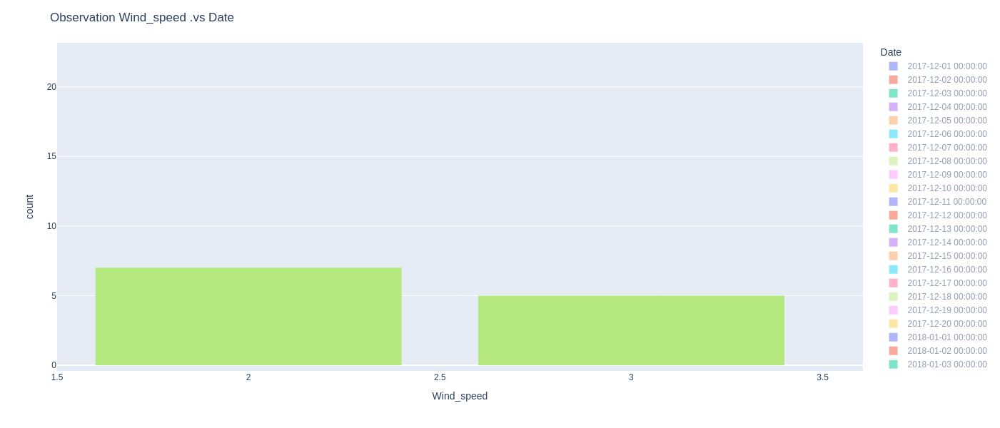

In [42]:
# Histogram that show how can see Temperature with Holiday  :
fig = px.histogram(df, x="Temperature", color="Holiday")
fig.update_layout(
    bargap=0.2,
    title="Observation Temperature .vs Holiday",
    legend_title="Holiday",
    width=800,  
    height=600  
)
fig.show()
#############################################################
# Histogram that show how can see Rainfall with Holiday  :
fig = px.histogram(df, x="Rainfall", color="Holiday")
fig.update_layout(
    bargap=0.2,
    title="Observation Rainfall .vs Holiday",
    legend_title="Holiday",
    width=800,  
    height=600  
)
fig.show()

##################################################################

# Here also you can see how Wind_speed feature liked with Date 

fig = px.histogram(df, x="Wind_speed", color="Date")
fig.update_layout(
    bargap=0.2,
    title="Observation Wind_speed .vs Date",
    legend_title="Date",
    width=800,  
    height=600  
)
fig.show()

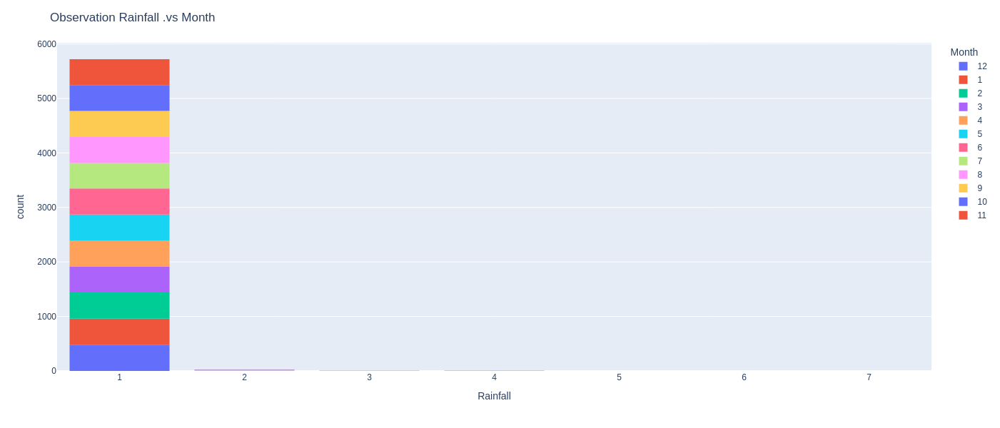

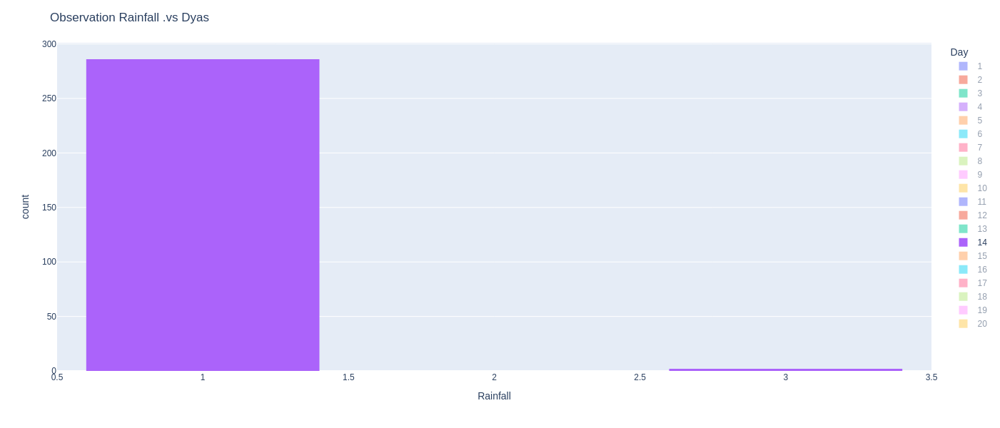

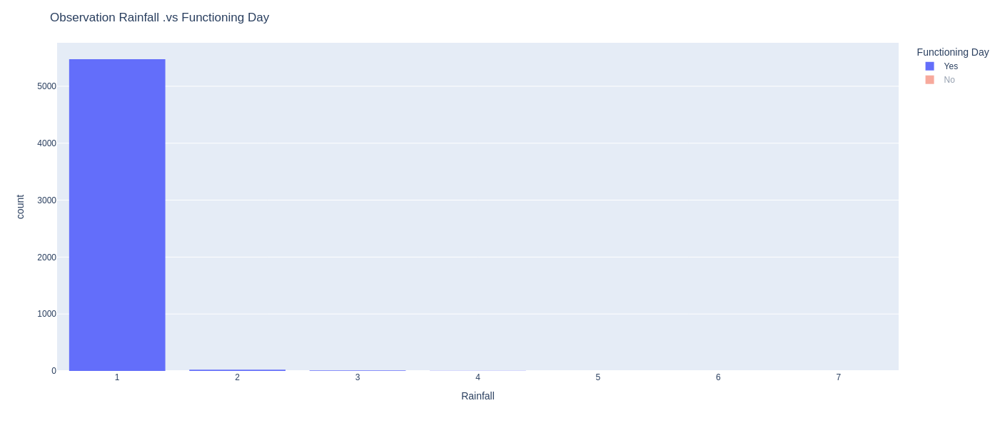

In [43]:
# Here also you can see how Rainfall feature liked with Month 

fig = px.histogram(df, x="Rainfall", color="Month")
fig.update_layout(
    bargap=0.2,
    title="Observation Rainfall .vs Month",
    legend_title="Month",
    width=800,  
    height=600  
)
fig.show()

######################################################

# Here also you can see how Rainfall feature liked with Days 

fig = px.histogram(df, x="Rainfall", color="Day")
fig.update_layout(
    bargap=0.2,
    title="Observation Rainfall .vs Dyas",
    legend_title="Day",
    width=800,  
    height=600  
)
fig.show()

###############################################################

# Here also you can see how Rainfall feature liked with  Functioning Day

fig = px.histogram(df, x="Rainfall", color="Functioning Day")
fig.update_layout(
    bargap=0.2,
    title="Observation Rainfall .vs Functioning Day",
    legend_title="Functioning Day",
    width=800,  
    height=600  
)
fig.show()

In [44]:
df.columns

Index(['ID', 'Date', 'y', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall(cm)', 'Seasons', 'Holiday', 'Functioning Day', 'Day', 'Month',
       'Year'],
      dtype='object')

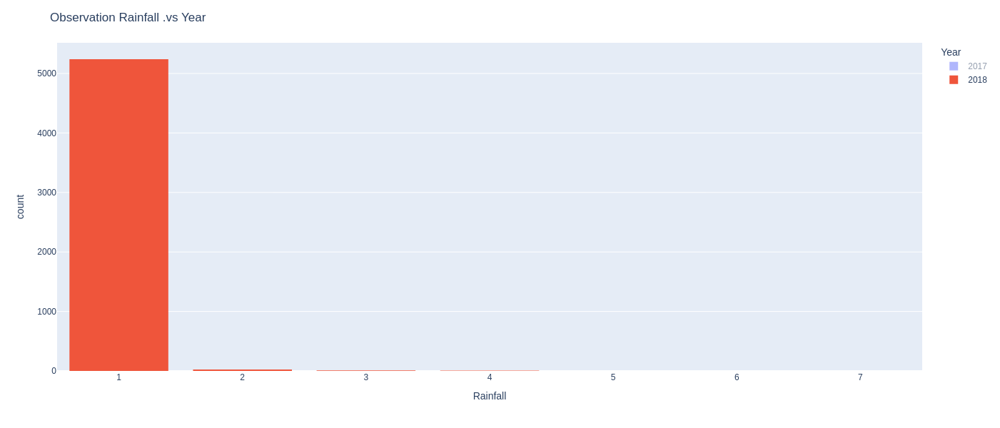

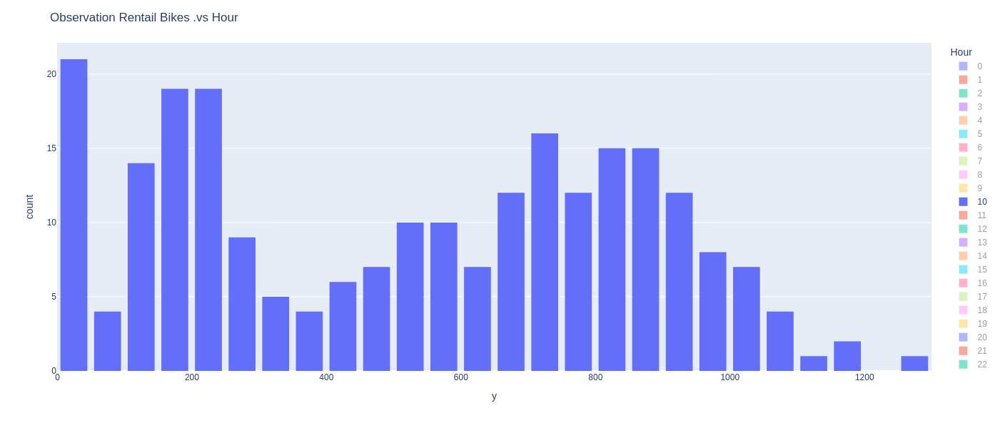

In [45]:
# whats the largest year that Rainfall is the biggest ?

fig = px.histogram(df, x="Rainfall", color="Year")
fig.update_layout(
    bargap=0.2,
    title="Observation Rainfall .vs Year",
    legend_title="Year",
    width=800,  
    height=600  
)
fig.show()
####################################################################

# in which hour was the largest Rentail Bikes ?
fig = px.histogram(df, x="y", color="Hour")
fig.update_layout(
    bargap=0.2,
    title="Observation Rentail Bikes .vs Hour",
    legend_title="Hour",
    width=800,  
    height=600  
)
fig.show()



In [46]:
df.columns

Index(['ID', 'Date', 'y', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall(cm)', 'Seasons', 'Holiday', 'Functioning Day', 'Day', 'Month',
       'Year'],
      dtype='object')

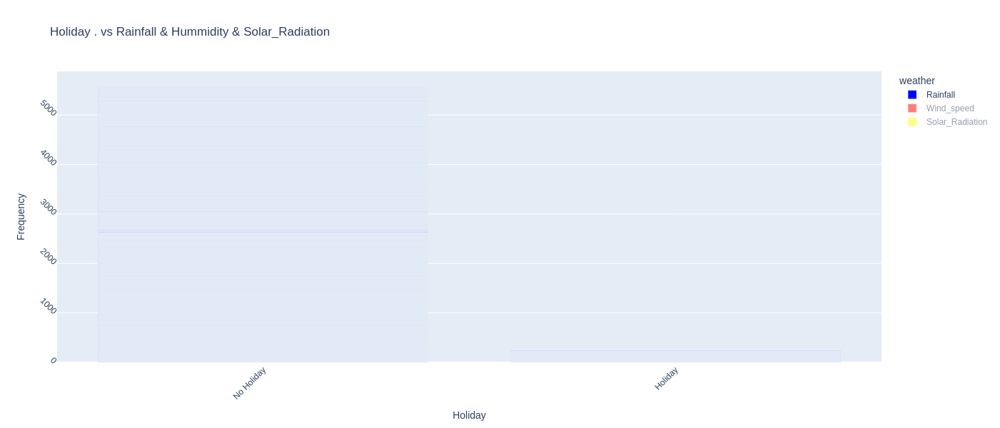

In [47]:
# whats the affect wheather on Holidays ?
# which Holiday are the most Solar_Radiation & Rainfall & Wind_speed :

x = df["Holiday"]
y1 =df["Rainfall"]
y2 = df["Wind_speed"]
y3=df["Solar_Radiation"]
    
fig = go.Figure(data=[
        go.Bar(name='Rainfall', x=x, y=y1,marker_color="blue"),
        go.Bar(name='Wind_speed', x=x, y=y2,marker_color="red"),
        go.Bar(name='Solar_Radiation',x=x,y=y3,marker_color="yellow")
    ])
    
fig.update_layout(barmode='group',
                      title='Holiday . vs Rainfall & Hummidity & Solar_Radiation ',
                      legend_title="weather",
                      width=800,  
                      height=600 ,       
                      xaxis_title="Holiday",
                      yaxis_title="Frequency",
                      xaxis_tickangle=-45,
                      yaxis_tickangle=45
    ) 
    
fig.show()


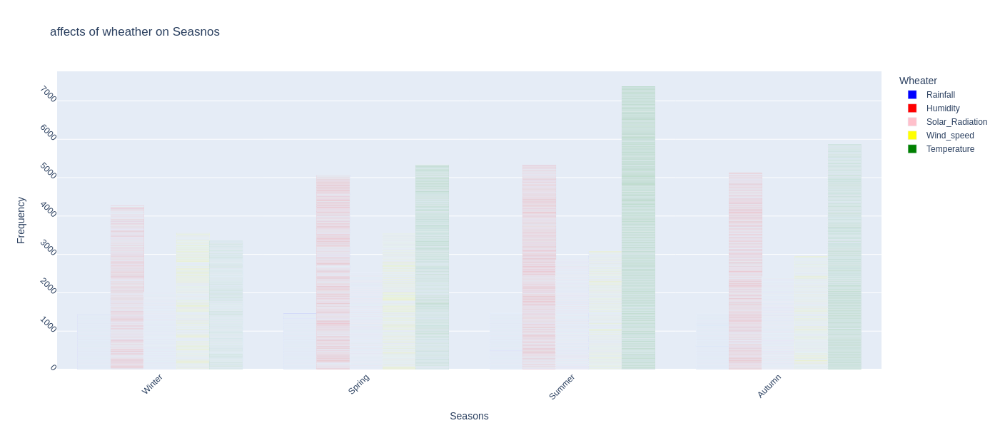

In [48]:
# whats The Relations Between Seasons & Wheather Condations ?

x = df["Seasons"]

y1 =df["Rainfall"]
y2 = df["Humidity"]
y3=df["Solar_Radiation"]
y4=df["Wind_speed"]
y5=df["Temperature"]

fig = go.Figure(data=[
        go.Bar(name='Rainfall', x=x, y=y1,marker_color="blue"),
        go.Bar(name='Humidity', x=x, y=y2,marker_color="red"),
        go.Bar(name='Solar_Radiation', x=x, y=y3,marker_color="pink"),
        go.Bar(name='Wind_speed', x=x, y=y4,marker_color="yellow"),
        go.Bar(name='Temperature', x=x, y=y5,marker_color="green")
        ])
    
fig.update_layout(barmode='group',
                      title='affects of wheather on Seasnos ',
                      legend_title="Wheater",
                      width=800,  
                      height=600 ,       
                      xaxis_title="Seasons",
                      yaxis_title="Frequency",
                      xaxis_tickangle=-45,
                      yaxis_tickangle=45
    ) 
    
fig.show()


In [49]:
df.columns

Index(['ID', 'Date', 'y', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall(cm)', 'Seasons', 'Holiday', 'Functioning Day', 'Day', 'Month',
       'Year'],
      dtype='object')

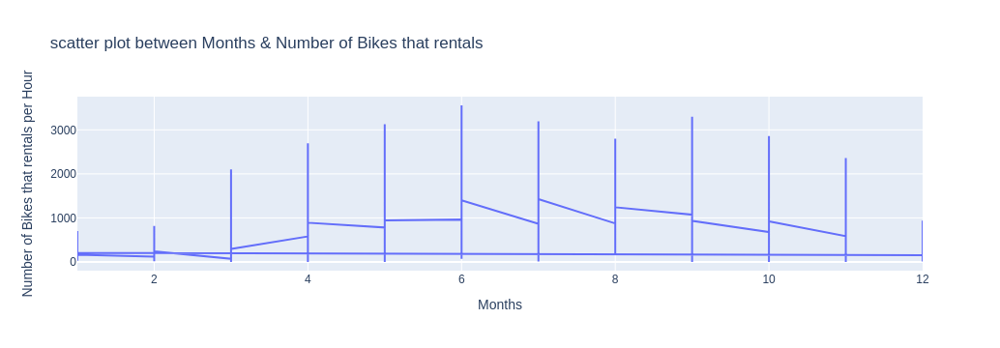

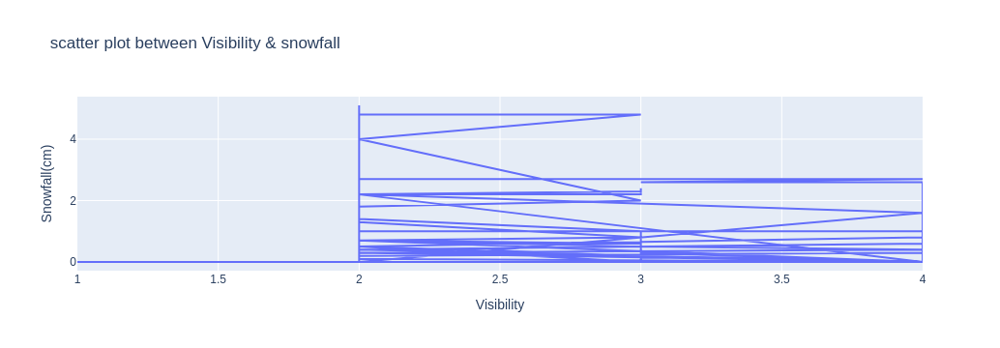

In [50]:
# Create scatter between Months & Number of Bikes that rentals :
x = df["Month"]
y = df["y"]
    
fig = go.Figure(data=[go.Scatter(x=x, y=y)])
    
# Update layout for better appearance
fig.update_layout(title='scatter plot between Months & Number of Bikes that rentals',
                      xaxis_title='Months',
                      yaxis_title='Number of Bikes that rentals per Hour')
    
# Display the plot
fig.show()

############################################################################


# Create scatter plot between Visibility & snowfall  :
x = df["Visibility"]
y = df["Snowfall(cm)"]
    
fig = go.Figure(data=[go.Scatter(x=x, y=y)])
    
# Update layout for better appearance
fig.update_layout(title='scatter plot between Visibility & snowfall ',
                      xaxis_title='Visibility',
                      yaxis_title='Snowfall(cm)')
    
# Display the plot
fig.show()






array([[<Axes: title={'center': 'ID'}>, <Axes: title={'center': 'Date'}>,
        <Axes: title={'center': 'y'}>, <Axes: title={'center': 'Hour'}>],
       [<Axes: title={'center': 'Temperature'}>,
        <Axes: title={'center': 'Humidity'}>,
        <Axes: title={'center': 'Wind_speed'}>,
        <Axes: title={'center': 'Visibility'}>],
       [<Axes: title={'center': 'Dew_point_temperature'}>,
        <Axes: title={'center': 'Solar_Radiation'}>,
        <Axes: title={'center': 'Rainfall'}>,
        <Axes: title={'center': 'Snowfall(cm)'}>],
       [<Axes: title={'center': 'Day'}>,
        <Axes: title={'center': 'Month'}>,
        <Axes: title={'center': 'Year'}>, <Axes: >]], dtype=object)

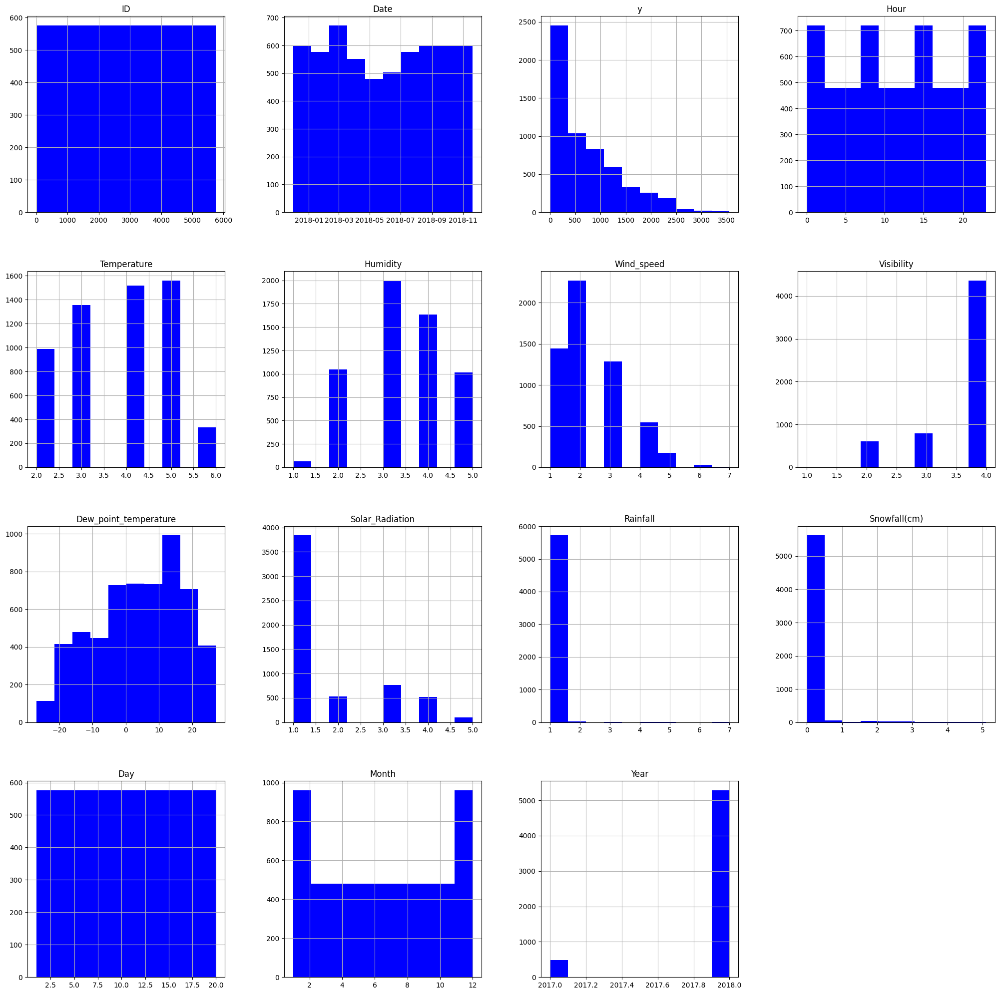

In [51]:
# plot the histgram:
df.hist(figsize=(25,25),color="b")

<Figure size 6250x6250 with 0 Axes>

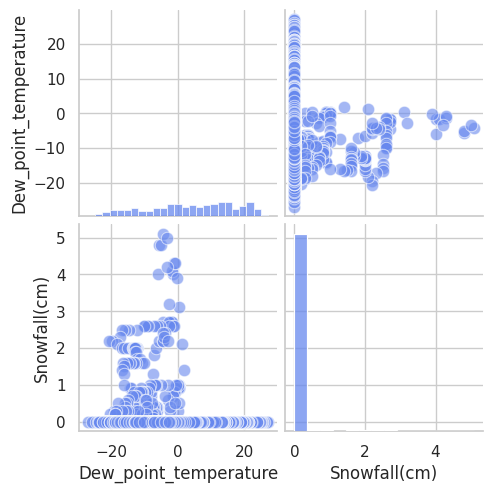

In [52]:
# observe for the float_data
plt.figure(figsize=(25, 25), dpi=250)
sns.set(style="whitegrid")  # Set the plot style
sns.set_palette("coolwarm")    # Set the color palette
sns.pairplot(df.select_dtypes(include='float64'), plot_kws={'alpha': 0.6, 's': 80})

## Transfer Categorical Data into Numerical :

In [53]:
df=pd.get_dummies(df)
df

,ID,Date,y,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,...,Month,Year,Seasons_Autumn,Seasons_Spring,Seasons_Summer,Seasons_Winter,Holiday_Holiday,Holiday_No Holiday,Functioning Day_No,Functioning Day_Yes
0,0,2017-12-01,254,0,2,2,3,4,-17.6,1,...,12,2017,False,False,False,True,False,True,False,True
1,1,2017-12-01,204,1,2,2,1,4,-17.6,1,...,12,2017,False,False,False,True,False,True,False,True
2,2,2017-12-01,173,2,2,2,2,4,-17.7,1,...,12,2017,False,False,False,True,False,True,False,True
3,3,2017-12-01,107,3,2,3,1,4,-17.6,1,...,12,2017,False,False,False,True,False,True,False,True
4,4,2017-12-01,78,4,2,2,3,4,-18.6,1,...,12,2017,False,False,False,True,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5755,5755,2018-11-20,1317,19,3,2,3,4,-6.3,1,...,11,2018,True,False,False,False,False,True,False,True
5756,5756,2018-11-20,1078,20,3,2,3,4,-7.2,1,...,11,2018,True,False,False,False,False,True,False,True
5757,5757,2018-11-20,1020,21,3,2,4,4,-5.1,1,...,11,2018,True,False,False,False,False,True,False,True
5758,5758,2018-11-20,922,22,3,3,4,4,-3.9,1,...,11,2018,True,False,False,False,False,True,False,True


## Split Data for Regression :


<div style="border: 5px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; i split data into x_reg & y_cly_regass </p> 

<p> &bull; x_reg : refer into all Data Except Target (y)</p> 

<p> &bull; y_reg : refer into Target (y)</p> 

<p> &bull; then , iused train_test_split method to divide data into test , train</p> 
</div>


In [54]:
# train split of the Data
x_train,x_test,y_train,y_test=train_test_split(x_reg,y_reg,test_size=0.3,random_state=42)
print("x_train shape : ",x_train.shape)
print("x_test shape : ",x_test.shape)
print("y_train shape : ",y_train.shape)
print("y_test shape : ",y_test.shape)

x_train shape :  (4032, 17)
x_test shape :  (1728, 17)
y_train shape :  (4032,)
y_test shape :  (1728,)


## Transfer Categorical Data into Numerical Data 

In [55]:
df=pd.get_dummies(df)
df

,ID,Date,y,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,...,Month,Year,Seasons_Autumn,Seasons_Spring,Seasons_Summer,Seasons_Winter,Holiday_Holiday,Holiday_No Holiday,Functioning Day_No,Functioning Day_Yes
0,0,2017-12-01,254,0,2,2,3,4,-17.6,1,...,12,2017,False,False,False,True,False,True,False,True
1,1,2017-12-01,204,1,2,2,1,4,-17.6,1,...,12,2017,False,False,False,True,False,True,False,True
2,2,2017-12-01,173,2,2,2,2,4,-17.7,1,...,12,2017,False,False,False,True,False,True,False,True
3,3,2017-12-01,107,3,2,3,1,4,-17.6,1,...,12,2017,False,False,False,True,False,True,False,True
4,4,2017-12-01,78,4,2,2,3,4,-18.6,1,...,12,2017,False,False,False,True,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5755,5755,2018-11-20,1317,19,3,2,3,4,-6.3,1,...,11,2018,True,False,False,False,False,True,False,True
5756,5756,2018-11-20,1078,20,3,2,3,4,-7.2,1,...,11,2018,True,False,False,False,False,True,False,True
5757,5757,2018-11-20,1020,21,3,2,4,4,-5.1,1,...,11,2018,True,False,False,False,False,True,False,True
5758,5758,2018-11-20,922,22,3,3,4,4,-3.9,1,...,11,2018,True,False,False,False,False,True,False,True


## Data Processing :







<div style="border: 5px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p>&bull; I used pipline method to make strong structure for processing for both scaler , labelEncoder & Onehot  </p>
<p> &bull; i used OneHotEncoder  method from to convert any object/Categorical data into Numerical </p> 

<p> &bull; Also i used Standard Scaler on this Data</p> 



## Create processing pipeline :

In [56]:
# Define the numeric features and categorical features
categorical_features =x_train.select_dtypes("object").columns
numeric_features = x_train.select_dtypes("number").columns

# Print the features to ensure they are correctly identified
print("Categorical Features:", categorical_features)
print("Numeric Features:", numeric_features)

# Create preprocessing pipelines for both numeric and categorical data
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

 

Categorical Features: Index(['Seasons', 'Holiday', 'Functioning Day'], dtype='object')
Numeric Features: Index(['ID', 'Hour', 'Temperature', 'Humidity', 'Wind_speed', 'Visibility',
       'Dew_point_temperature', 'Solar_Radiation', 'Rainfall', 'Snowfall(cm)',
       'Day', 'Month', 'Year'],
      dtype='object')


## Bulding Regression models :

<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">



<p> &bull; RandomForestRegressor  </p> 

<p> &bull; DecisionTreeRegressor  </p> 

<p> &bull; RidgeRegression  </p> 

<p> &bull; gradient boosting regressor  </p>

<p> &bull; Polynimial Regression   </p>

<p> &bull; Linear Regression   </p>

</div>



In [57]:
## Define the models :

RG = Ridge(alpha=0.1)
DT=DecisionTreeRegressor(max_depth=9,max_features=10,random_state=42)
poly = PolynomialFeatures(degree=2)
LR=LinearRegression()

gridsearch1=GridSearchCV(estimator=RandomForestRegressor(),
                        param_grid={"n_estimators":[70,100,250,300],
                        "max_depth":[50,120,200,300]},
                         cv=3,
                         return_train_score=False,
                         scoring='r2')

gridsearch2=GridSearchCV(estimator=GradientBoostingRegressor(),
                        param_grid={"n_estimators":[20,50,80,120],
                        "max_depth":[50,90,120,200]},
                         cv=3,
                         return_train_score=False,
                         scoring='r2')



In [58]:
# Create the pipelines for each model


pipeline_random_forest = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('random_forest',gridsearch1 )
])

pipeline_decision_tree = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('decision_tree', DT)
])


pipeline_gradient = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('gridsearch',gridsearch2)
])

pipeline_poly_linear=Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('polynomial',poly),
    ('linear',LR)
])

pipeline_poly_Ridge=Pipeline(steps=[
    ('preprocessor', preprocessor),
     ('polynomial',poly),
    ('Ridge',RG)
])


In [59]:
# Train the models using the pipelines

pipeline_random_forest.fit(x_train, y_train)
pipeline_decision_tree.fit(x_train, y_train)
pipeline_poly_Ridge.fit(x_train, y_train)
pipeline_gradient.fit(x_train, y_train)
pipeline_poly_linear.fit(x_train,y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['ID', 'Hour', 'Temperature', 'Humidity', 'Wind_speed', 'Visibility',
       'Dew_point_temperature', 'Solar_Radiation', 'Rainfall', 'Snowfall(cm)',
       'Day', 'Month', 'Year'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',


In [60]:
print("best parameters for GradientBoosting:",pipeline_gradient.best_estimator_)
print("best parameters for GradientBoosting:",pipeline_random_forest.best_estimator_)

AttributeError: 'Pipeline' object has no attribute 'best_estimator_'

Model: GridSearchCV(cv=3, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [50, 120, 200, 300],
                         'n_estimators': [70, 100, 250, 300]},
             scoring='r2')
R2 Train Score: 0.9829777224396602
R2 Test Score: 0.8782579383175867
--------------------------------------------------
Mean Squared Error of Train: 7257.788590579365
Mean Squared Error of Test: 53055.926919425925
--------------------------------------------------
Model accuracy: 0.8782579383175867
Model_Mean_square_Error: 53055.926919425925


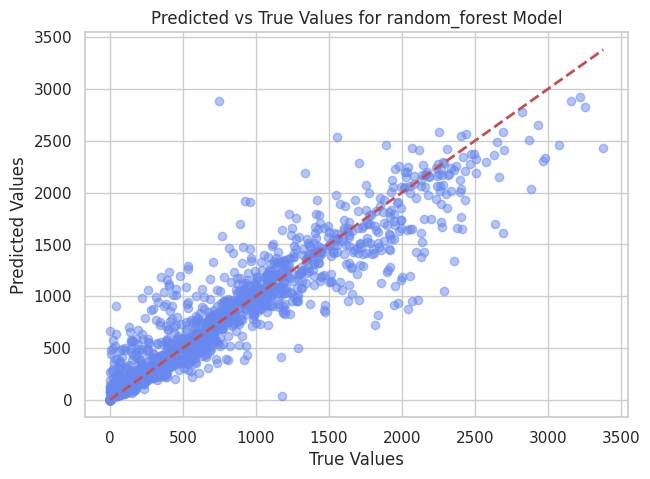

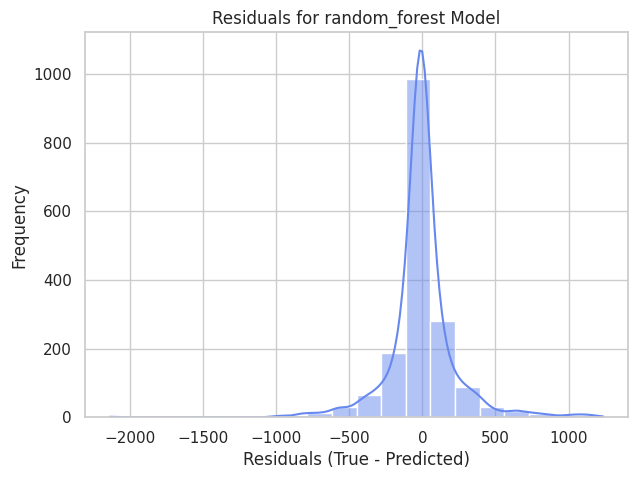

Model: DecisionTreeRegressor(max_depth=9, max_features=10, random_state=42)
R2 Train Score: 0.826836049977625
R2 Test Score: 0.7753143632336503
--------------------------------------------------
Mean Squared Error of Train: 73831.91446133112
Mean Squared Error of Test: 97919.35966402487
--------------------------------------------------
Model accuracy: 0.7753143632336503
Model_Mean_square_Error: 97919.35966402487


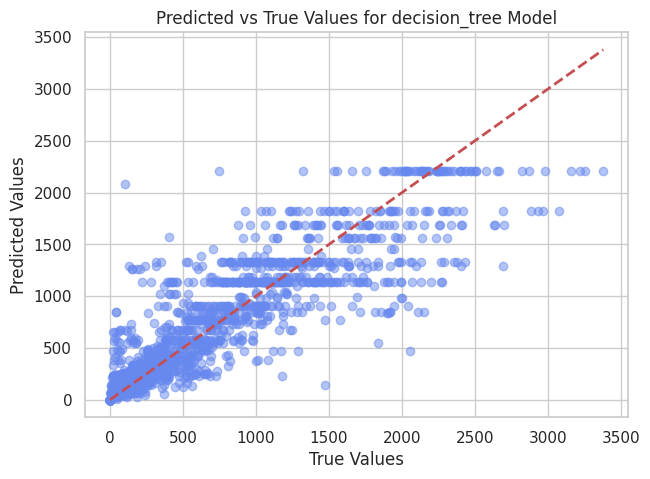

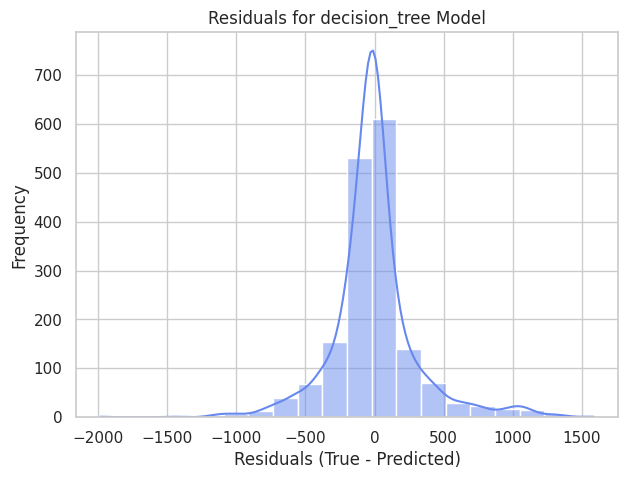

Model: GridSearchCV(cv=3, estimator=GradientBoostingRegressor(),
             param_grid={'max_depth': [50, 90, 120, 200],
                         'n_estimators': [20, 50, 80, 120]},
             scoring='r2')
R2 Train Score: 0.9852191170585654
R2 Test Score: 0.819505153827006
--------------------------------------------------
Mean Squared Error of Train: 6302.125152804249
Mean Squared Error of Test: 78660.74580590725
--------------------------------------------------
Model accuracy: 0.819505153827006
Model_Mean_square_Error: 78660.74580590725


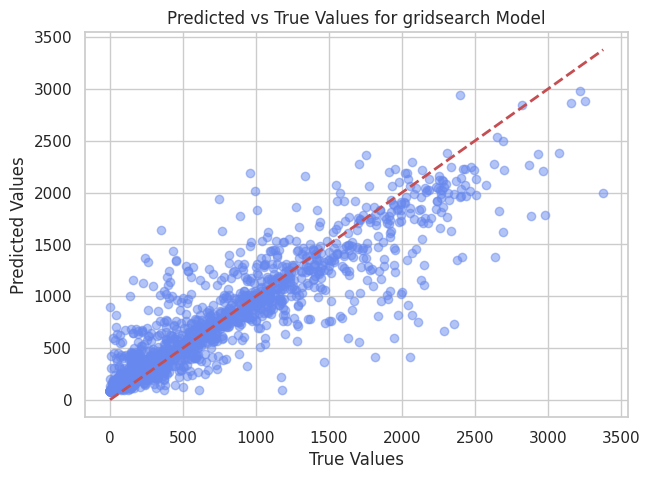

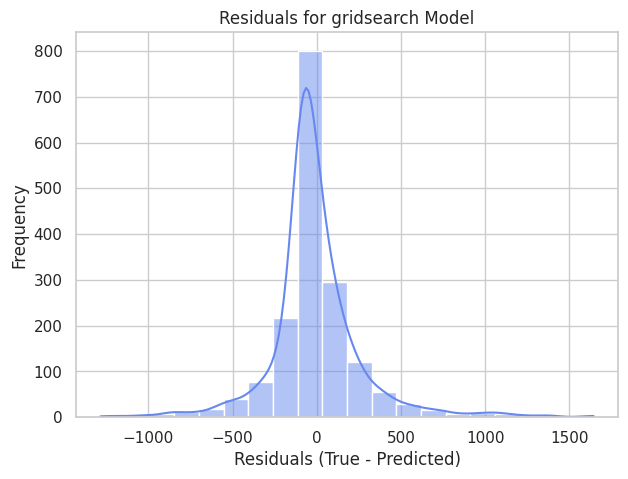

Model: LinearRegression()
R2 Train Score: 0.7165260709269878
R2 Test Score: 0.7022191746283408
--------------------------------------------------
Mean Squared Error of Train: 120864.78092369535
Mean Squared Error of Test: 129774.68502332242
--------------------------------------------------
Model accuracy: 0.7022191746283408
Model_Mean_square_Error: 129774.68502332242


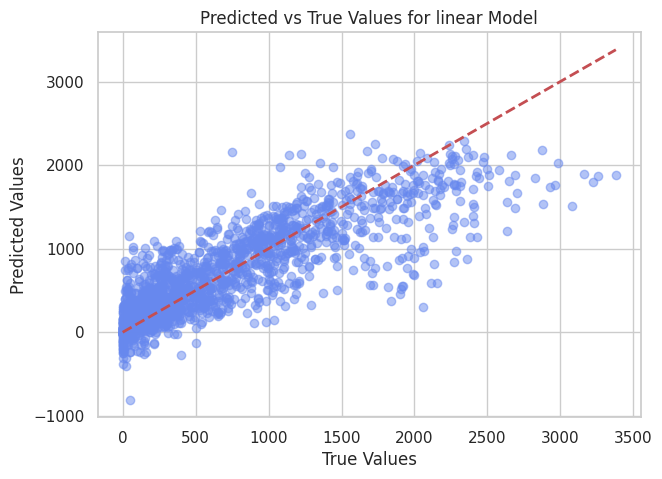

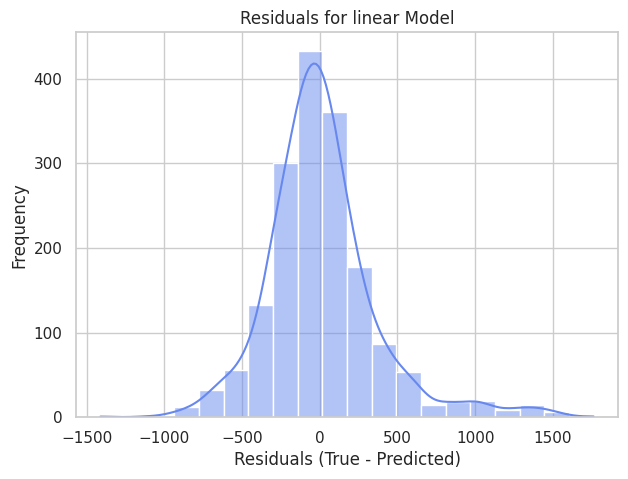

Model: Ridge(alpha=0.1)
R2 Train Score: 0.7165223454518987
R2 Test Score: 0.7021758393697661
--------------------------------------------------
Mean Squared Error of Train: 120866.36935453251
Mean Squared Error of Test: 129793.57079115162
--------------------------------------------------
Model accuracy: 0.7021758393697661
Model_Mean_square_Error: 129793.57079115162


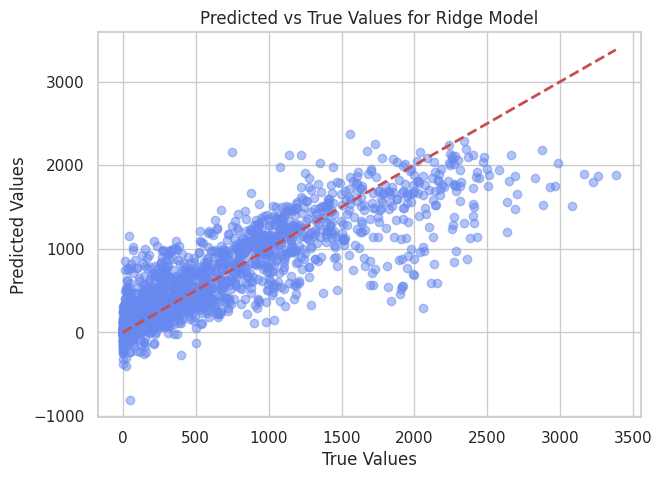

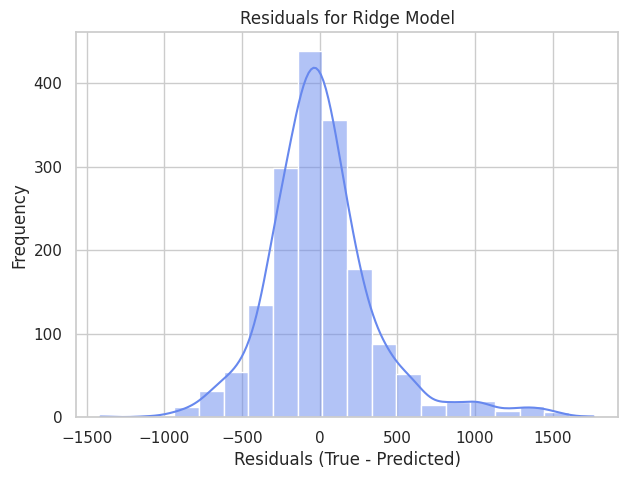

In [61]:
# Define a function to evaluate a regression pipeline & to check if found overfitting :

def evaluate_pipeline(pipeline, X_train, X_test, y_train, y_test, sc_y=None):
    y_pred = pipeline.predict(X_test)
    y_train_pred = pipeline.predict(X_train)
    
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_pred)
    acc=pipeline.score(X_test,y_test)
    
    mse_train = mean_squared_error(y_train, y_train_pred)
    mse_test = mean_squared_error(y_test, y_pred)
    mse_model=mean_squared_error(y_test,y_pred)
    
    if sc_y is not None:
        y_pred = sc_y.inverse_transform(y_pred.reshape(-1, 1))
        y_train_pred = sc_y.inverse_transform(y_train_pred.reshape(-1, 1))
        
        r2_test = r2_score(sc_y.inverse_transform(y_test.reshape(-1, 1)), y_pred)
        mse_test = mean_squared_error(sc_y.inverse_transform(y_test.reshape(-1, 1)), y_pred)
    
    print(f"Model: {pipeline.steps[-1][1]}")
    print("R2 Train Score:", r2_train)
    print("R2 Test Score:", r2_test)
    print("-"*50)
    print("Mean Squared Error of Train:", mse_train)
    print("Mean Squared Error of Test:", mse_test)
    print("-"*50)
    print("Model accuracy:",acc)
    print("Model_Mean_square_Error:",mse_model)
    
    # Plot the predicted vs true values
    plt.figure(figsize=(7, 5))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
    plt.xlabel('True Values')
    plt.ylabel('Predicted Values')
    plt.title(f'Predicted vs True Values for {pipeline.steps[-1][0]} Model')
    plt.show()
    
    # Plot the residuals
    plt.figure(figsize=(7, 5))
    sns.histplot((y_test - y_pred), bins=20, kde=True)
    plt.xlabel('Residuals (True - Predicted)')
    plt.ylabel('Frequency')
    plt.title(f'Residuals for {pipeline.steps[-1][0]} Model')
    plt.show()



evaluate_pipeline(pipeline_random_forest, x_train, x_test, y_train, y_test)
evaluate_pipeline(pipeline_decision_tree, x_train, x_test, y_train, y_test)
evaluate_pipeline(pipeline_gradient, x_train, x_test, y_train, y_test)
evaluate_pipeline(pipeline_poly_linear, x_train, x_test, y_train, y_test)
evaluate_pipeline(pipeline_poly_Ridge, x_train, x_test, y_train, y_test)

In [62]:
# Access the decision tree regressor from the pipeline
DT = pipeline_decision_tree.named_steps['decision_tree']
feature_importances = DT.feature_importances_
# Create a Series with feature importances
importance_series = pd.Series(feature_importances, index=x_reg.columns).sort_values(ascending=False)

print("Feature Importances:\n", importance_series)

ValueError: Length of values (21) does not match length of index (17)

In [63]:
from sklearn.tree import export_graphviz
tree_data = export_graphviz(DT, filled=True, rounded=True, feature_names=x_reg.columns, out_file=None)
graphviz.Source(tree_data)

ValueError: Length of feature_names, 17 does not match number of features, 21

## Conclusion :














<div style="border: 5px solid green; padding: 10px; background-color: #F5F5F5; color: #4933ff; border-radius: 30px 45px 30px 45px;">


    
<p>&bull; in the Conclusion i want to thank all team of Neuro & Especially Eng\Taher .</p>
<p>&bull; thanks for all Neuro Team .</p>

<img src="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRS7ljsKnRCGIkKlSRUEC4LsQym9eQNPFnvwA&s" alt="My Image">

<p>&bull; Your support is greatly appreciated! .</p>


<p>&bull; Kaggle: Your Home for Data Science</p>


<p>&bull; <a href="https://www.kaggle.com/abdalrhamnhebishy" target="_blank">Kaggle profile</a>.</p>


<p>&bull;  AbdalRhman Hebishy , DataScientist||Machine learning||Deeplearning Engineer .</p>
   

</div>

<img src="Neuro.jpg" alt="My Image">